In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
from Dirichlet_exp_utils import *
import tikzplotlib as tpl
%matplotlib inline

pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

np.random.seed(0)

In [2]:
# import all elections for Tübingen from 2002 to 2017

elections_2002_Tübingen_df = pd.read_csv('Bundestagswahlen_Wahlbezirke_clean/Tübingen_2002.csv')
elections_2005_Tübingen_df = pd.read_csv('Bundestagswahlen_Wahlbezirke_clean/Tübingen_2005.csv')
elections_2009_Tübingen_df = pd.read_csv('Bundestagswahlen_Wahlbezirke_clean/Tübingen_2009.csv')
elections_2013_Tübingen_df = pd.read_csv('Bundestagswahlen_Wahlbezirke_clean/Tübingen_2013.csv')
elections_2017_Tübingen_df = pd.read_csv('Bundestagswahlen_Wahlbezirke_clean/Tübingen_2017.csv')

years = [2002, 2005, 2009, 2013, 2017]

In [3]:
# check out all districts

elections_2017_Tübingen_df['Wahlbezirk']

0                    011-01 Marktplatz
1          011-02 Innenstadt Nord-West
2                       011-03 Haagtor
3           011-04 Innenstadt Nord-Ost
4                     011-05 Neckartor
5                      012-01 Föhrberg
6                   012-02 Universität
7                 012-03 Schnarrenberg
8                    012-04 Viehweidle
9               012-05 Frischlinstraße
10                   013-01 Wanne-West
11                      013-02 Horemer
12                    013-03 Wanne-Süd
13                    013-04 Wanne-Ost
14                   014-02 Schönblick
15                  014-03 Winkelwiese
16       014-04 Waldhäuser-Ost I (ost)
17     014-05 Waldhäuser-Ost II (west)
18     014-06 Waldhäuser-Ost III (süd)
19                    015-01 Österberg
20                 015-02 Gartenstraße
21        016-01 Französisches Viertel
22              017-01 Schellingstraße
23                  017-02 Volksgarten
24                   017-03 Sternplatz
25              017-04 Ma

In [4]:
elections_2017_Tübingen_df[elections_2017_Tübingen_df['Wahlbezirk'] == '011-01 Marktplatz']

,Unnamed: 0,Wahlbezirk,Gültig,CDU/CSU,SPD,FDP,GRÜNE,DIE LINKE,AfD,PIRATEN,DIE PARTEI,OTHER
0,85751,011-01 Marktplatz,508,67,94,40,148,119,10,1,14,15


In [5]:
elections_2017_Tübingen_df[elections_2017_Tübingen_df['Wahlbezirk'] == '016-01 Französisches Viertel']

,Unnamed: 0,Wahlbezirk,Gültig,CDU/CSU,SPD,FDP,GRÜNE,DIE LINKE,AfD,PIRATEN,DIE PARTEI,OTHER
21,85772,016-01 Französisches Viertel,708,60,83,46,262,198,25,2,9,23


In [6]:
elections_2017_Tübingen_df[elections_2017_Tübingen_df['Wahlbezirk'] == '013-03 Wanne-Süd']

,Unnamed: 0,Wahlbezirk,Gültig,CDU/CSU,SPD,FDP,GRÜNE,DIE LINKE,AfD,PIRATEN,DIE PARTEI,OTHER
12,85763,013-03 Wanne-Süd,558,162,97,90,125,40,31,2,3,8


In [7]:
# drop column "Gebiet"
#small_df = small_df.drop(columns=['Gebiet'])

# apply the Laplace Bridge
def Dirichlet_bridge_mu(alpha):
    alpha = np.array(alpha, dtype='float')
    k = len(alpha)
    C = 1/k * np.sum(np.log(alpha))
    return(np.log(alpha) - C)

def Dirichlet_bridge_Sigma(alpha):
    K = len(alpha)
    Sigma = np.zeros((K, K))
    sum_inv_alphas = np.sum(1/alpha)
    for k in range(K):
        for l in range(K):
            x_ = -1/K * (1/alpha[k] + 1/alpha[l] - 1/K*sum_inv_alphas)
            if k == l:
                x_ += 1/alpha[k]
            Sigma[k,l] = x_
            
    return(Sigma)

def Dirichlet_bridge_alpha(mu, Sigma):
    K = len(mu)
    Sigma_diag = np.diag(Sigma)
    sum_m_exp = np.sum(np.exp(-mu))
    return(1/Sigma_diag * (1 - 2/K + np.exp(mu)/K**2 * sum_m_exp))


def softmax_vector(mu):
    mu = np.array(mu)
    return(np.exp(mu)/np.sum(np.exp(mu)))

def softmax_batch(mu_batch):
    mu_batch = np.array(mu_batch)
    return(np.exp(mu_batch)/np.sum(np.exp(mu_batch), 1)[:,np.newaxis])

# Tübingen elections with Dirichlet + GP (3 selected Wahlbezirke)

In [8]:
# Select the 10 Wahlkreise (Ger + 9 counties) with the 9 parties

cols = ['Wahlbezirk', 'Gültig', 'CDU/CSU', 'SPD', 'FDP', 'GRÜNE',
       'DIE LINKE', 'AfD', 'PIRATEN', 'DIE PARTEI', 'OTHER']

regions = ['011-01 Marktplatz', '013-03 Wanne-Süd', '016-01 Französisches Viertel',
          '011-01', '013-03', '016-01']

parties = ['CDU/CSU', 'SPD', 'FDP', 'GRÜNE', 'DIE LINKE', 'AfD', 'PIRATEN', 'DIE PARTEI', 'OTHER']

n_regions = 3
n_parties = 9

medium_df = pd.DataFrame(columns=cols)
    
dfs = [elections_2002_Tübingen_df, elections_2005_Tübingen_df, elections_2009_Tübingen_df, 
       elections_2013_Tübingen_df, elections_2017_Tübingen_df]
    

for df in dfs:
    df_ = df[cols]
    df_ = df_.loc[df['Wahlbezirk'].isin(regions)]
    medium_df = medium_df.append(df_)


medium_df = medium_df.drop(columns=['Wahlbezirk', 'Gültig'])

assert(len(years) * n_regions == len(medium_df))
    
medium_df

,CDU/CSU,SPD,FDP,GRÜNE,DIE LINKE,AfD,PIRATEN,DIE PARTEI,OTHER
0,92,188,36,209,15,0.0,0.0,0.0,10.0
12,184,159,57,172,11,0.0,0.0,0.0,9.0
22,74,149,34,313,58,0.0,0.0,0.0,12.0
0,114,141,61,214,55,0.0,0.0,0.0,13.0
12,173,161,71,136,12,0.0,0.0,0.0,5.0
22,57,178,42,320,82,0.0,0.0,0.0,10.0
0,62,105,43,228,54,0.0,23.0,0.0,13.0
12,146,146,97,124,20,0.0,12.0,0.0,9.0
22,44,148,57,333,108,0.0,31.0,0.0,13.0
0,94,121,21,151,75,16.0,23.0,0.0,15.0


# Create the GP + LM

In [9]:
P = np.arange(1,n_parties + 1)
C = np.arange(1,n_regions + 1)

X = np.zeros((len(years)*len(C)*len(P), 3))

print(np.shape(X))
idx = 0
for t in years:
    for c in C:
        for p in P:
            X[idx] = [t, c, p]
            idx += 1
            
print(X[:-10])

(135, 3)
[[2.002e+03 1.000e+00 1.000e+00]
 [2.002e+03 1.000e+00 2.000e+00]
 [2.002e+03 1.000e+00 3.000e+00]
 [2.002e+03 1.000e+00 4.000e+00]
 [2.002e+03 1.000e+00 5.000e+00]
 [2.002e+03 1.000e+00 6.000e+00]
 [2.002e+03 1.000e+00 7.000e+00]
 [2.002e+03 1.000e+00 8.000e+00]
 [2.002e+03 1.000e+00 9.000e+00]
 [2.002e+03 2.000e+00 1.000e+00]
 [2.002e+03 2.000e+00 2.000e+00]
 [2.002e+03 2.000e+00 3.000e+00]
 [2.002e+03 2.000e+00 4.000e+00]
 [2.002e+03 2.000e+00 5.000e+00]
 [2.002e+03 2.000e+00 6.000e+00]
 [2.002e+03 2.000e+00 7.000e+00]
 [2.002e+03 2.000e+00 8.000e+00]
 [2.002e+03 2.000e+00 9.000e+00]
 [2.002e+03 3.000e+00 1.000e+00]
 [2.002e+03 3.000e+00 2.000e+00]
 [2.002e+03 3.000e+00 3.000e+00]
 [2.002e+03 3.000e+00 4.000e+00]
 [2.002e+03 3.000e+00 5.000e+00]
 [2.002e+03 3.000e+00 6.000e+00]
 [2.002e+03 3.000e+00 7.000e+00]
 [2.002e+03 3.000e+00 8.000e+00]
 [2.002e+03 3.000e+00 9.000e+00]
 [2.005e+03 1.000e+00 1.000e+00]
 [2.005e+03 1.000e+00 2.000e+00]
 [2.005e+03 1.000e+00 3.000e+00]
 

(135, 135)


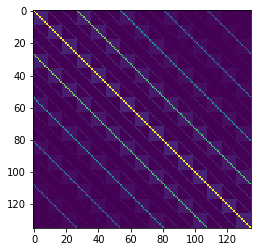

In [10]:
# build the kernel

def k_SEK(x, x_, s=1, l=2):
    return(s*np.exp(-(x-x_)**2 / (2*l**2)))

def k_RQ(x, x_, s=1, l=4, a=0.5):
    return(s**2 * (1 + (x-x_)**2/(2*a*l**2)))**(-a)

def k_dirac_soft(x, x_):
    if x == x_:
        return(1)
    else:
        return(0.1)

n = len(X)
K_XX = np.zeros((n, n))
for i in range(n):
    for j in range(n):
        t_i = X[i,0]
        c_i = X[i,1]
        p_i = X[i,2]
        t_j = X[j,0]
        c_j = X[j,1]
        p_j = X[j,2]
        #K_XX[i, j] = k_SEK(t_i, t_j) * k_dirac_soft(c_i, c_j) * k_dirac_soft(p_i, p_j)
        K_XX[i, j] = k_RQ(t_i, t_j) * k_dirac_soft(c_i, c_j) * k_dirac_soft(p_i, p_j)
        
print(np.shape(K_XX))
K_XX[:10,:10]

plt.imshow(K_XX)
plt.show()

In [11]:
# prep y data

#prior for the dirichlet
alpha_0 = 1

t0 = time.time()
Y_mu = np.array([Dirichlet_bridge_mu(np.array(row[1].values) + alpha_0) for row in medium_df.iterrows()])
t1 = time.time()
print("mu transformation time: ", t1 - t0)
Y_mu = Y_mu.reshape(-1)

t0 = time.time()
Y_Sigma = [Dirichlet_bridge_Sigma(np.array(row[1].values) + alpha_0) for row in medium_df.iterrows()]
t1 = time.time()
print("Sigma transformation time: ", t1 - t0)

Y_Sigma_block = np.zeros((n,n))
idx = 0
for S in Y_Sigma:
    Y_Sigma_block[idx:idx+n_parties, idx:idx+n_parties] = S
    idx += n_parties

mu transformation time:  0.0023086071014404297
Sigma transformation time:  0.0020904541015625


In [12]:
# compute the equations for the GP

from numpy.random import randn, multivariate_normal
from numpy.linalg import cholesky, solve
from scipy.linalg import cho_solve, cho_factor
import time

G_ = K_XX + Y_Sigma_block
t0 = time.time()
G = cho_factor(G_)
t1 = time.time()
print("time for cho factor: ", t1 - t0)

time for cho factor:  0.0068950653076171875


In [13]:
#make predictions for all years in between the elections

T_x = np.arange(2002, 2017+1)
P_x = np.arange(1,n_parties + 1)
C_x = np.arange(1,n_regions + 1)

x = np.zeros((len(T_x)*len(C_x)*len(P_x), 3))
print(np.shape(x))
idx = 0
for t in T_x:
    for c in C_x:
        for p in P_x:
            x[idx] = [t, c, p]
            idx += 1

n_ = len(x)
K_xX = np.zeros((n_, n))
for i in range(n_):
    for j in range(n):
        t_i = x[i,0]
        c_i = x[i,1]
        p_i = x[i,2]
        t_j = X[j,0]
        c_j = X[j,1]
        p_j = X[j,2]
        #K_xX[i, j] = k_SEK(t_i, t_j) * k_dirac_soft(c_i, c_j) * k_dirac_soft(p_i, p_j)
        K_xX[i, j] = k_RQ(t_i, t_j) * k_dirac_soft(c_i, c_j) * k_dirac_soft(p_i, p_j)
        
print(np.shape(K_xX))

K_xx = np.zeros((n_, n_))
for i in range(n_):
    for j in range(n_):
        t_i = x[i,0]
        c_i = x[i,1]
        p_i = x[i,2]
        t_j = x[j,0]
        c_j = x[j,1]
        p_j = x[j,2]
        #K_xx[i, j] = k_SEK(t_i, t_j) * k_dirac_soft(c_i, c_j) * k_dirac_soft(p_i, p_j)
        K_xx[i, j] = k_RQ(t_i, t_j) * k_dirac_soft(c_i, c_j) * k_dirac_soft(p_i, p_j)
        
print(np.shape(K_xx))

(432, 3)
(432, 135)
(432, 432)


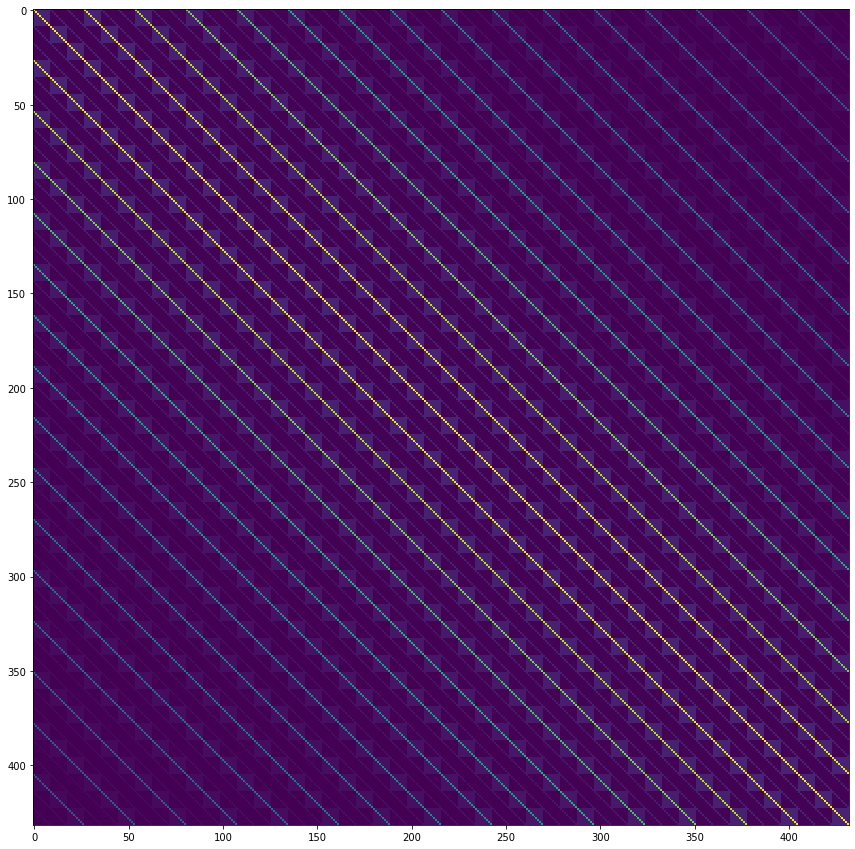

In [14]:
plt.figure(figsize=(15, 15))
plt.imshow(K_xx)
plt.show();

In [15]:
# do some inference 
t0 = time.time()
A = cho_solve(G, K_xX.T).T
t1 = time.time()
print("cho solve: ", t1-t0)

out = {}

# # posterior p(f_x|Y) = N(f_x,mpost,vpost)
t0 = time.time()
out["mpost"] = A @ Y_mu #m(x) + A @ (Y - mX)  # mean
t1 = time.time()
print("matrix multiplication with mu: ", t1-t0)
print(np.shape(out['mpost']))

t0 = time.time()
out["vpost"] = K_xx - A @ K_xX.T  # covariance
t1 = time.time()
print("Computing Kernel for prediction: ", t1-t0)
print(np.shape(out['vpost']))

n_GP_samples = 10000

# draw samples for computation
out["spost"] = multivariate_normal(
    out["mpost"].flatten(), out["vpost"], size=n_GP_samples
)

n_GP_samples_show = 50

# draw samples for plotting
out["spost_show"] = multivariate_normal(
    out["mpost"].flatten(), out["vpost"], size=n_GP_samples_show
)

cho solve:  0.005491733551025391
matrix multiplication with mu:  0.0001323223114013672
(432,)
Computing Kernel for prediction:  0.0016591548919677734
(432, 432)


In [16]:
Tübingen_pred = out["mpost"]
Tübingen_pred_v = np.diag(out["vpost"])
print(np.shape(Tübingen_pred))
print(np.shape(Tübingen_pred_v))

Tübingen_pred = Tübingen_pred.reshape((-1, n_regions*n_parties))
Tübingen_pred_v = Tübingen_pred_v.reshape((-1, n_regions*n_parties))

Tübingen_pred_Markt = Tübingen_pred[:, :n_parties]
Tübingen_pred_Wanne = Tübingen_pred[:, n_parties:2*n_parties]
Tübingen_pred_Franz = Tübingen_pred[:, 2*n_parties:3*n_parties]

Tübingen_pred_Markt_v = Tübingen_pred_v[:, :n_parties]
Tübingen_pred_Wanne_v = Tübingen_pred_v[:, n_parties:2*n_parties]
Tübingen_pred_Franz_v = Tübingen_pred_v[:, 2*n_parties:3*n_parties]

print(np.shape(Tübingen_pred_Markt))
print(np.shape(Tübingen_pred_Markt_v))

(432,)
(432,)
(16, 9)
(16, 9)


In [17]:
# Bridge back to Dirichlet land via softmax

sm_results_Markt = softmax_batch(Tübingen_pred_Markt)
sm_cumulative_Markt = np.cumsum(sm_results_Markt, 1)

sm_results_Wanne = softmax_batch(Tübingen_pred_Wanne)
sm_cumulative_Wanne = np.cumsum(sm_results_Wanne, 1)

sm_results_Franz = softmax_batch(Tübingen_pred_Franz)
sm_cumulative_Franz = np.cumsum(sm_results_Franz, 1)


In [18]:
# define colors of parties
parties = ['CDU/CSU', 'SPD', 'FDP', 'GRÜNE', 'DIE LINKE', 'AfD', 'PIRATEN', 'DIE PARTEI', 'OTHER']

party_colors = {
    'CDU/CSU':'black',
    'SPD':'red',
    'FDP':'yellow',
    'GRÜNE':'green',
    'DIE LINKE':'magenta',
    'AfD':'deepskyblue',
    'PIRATEN':'purple',
    'DIE PARTEI':'firebrick',
    'OTHER':'grey'
}

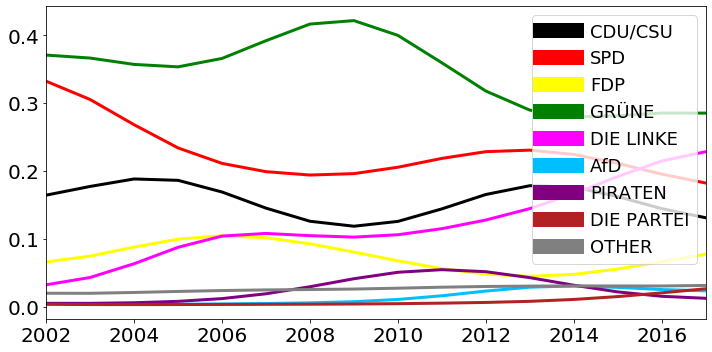

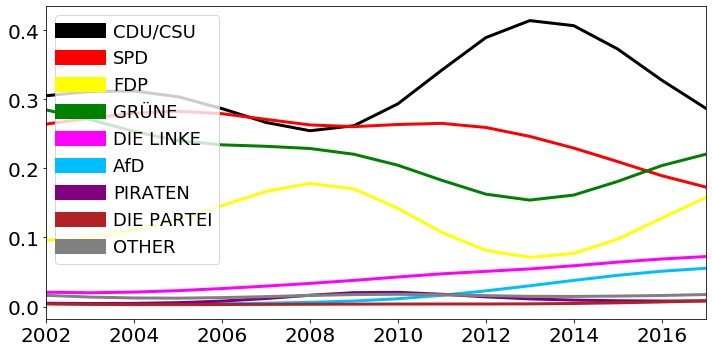

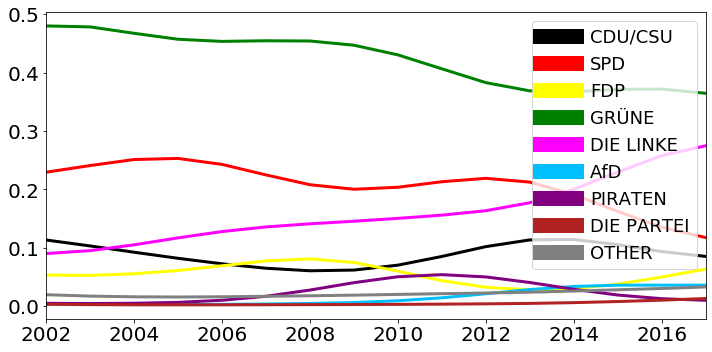

In [19]:
sm_results = [sm_results_Markt, sm_results_Wanne, sm_results_Franz]

results_v = [Tübingen_pred_Markt_v, Tübingen_pred_Wanne_v, Tübingen_pred_Franz_v]

filenames = ['sm_Markt.pdf', 'sm_Wanne.pdf', 'sm_Franz.pdf']

for j in range(len(sm_results)):
    
    r = sm_results[j]
    plot_elections_mean(r, filename=filenames[j], x=T_x, parties=parties, party_colors=party_colors, save=False, legend=True)

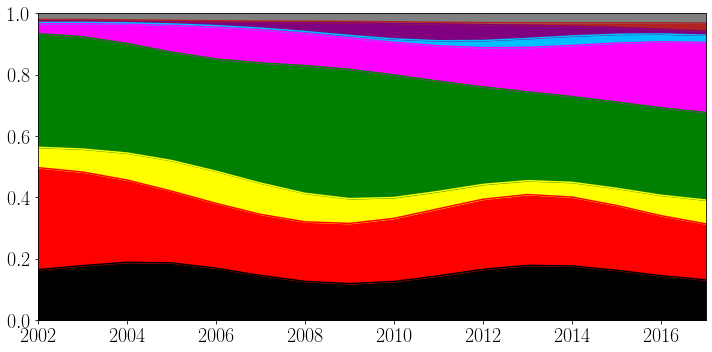

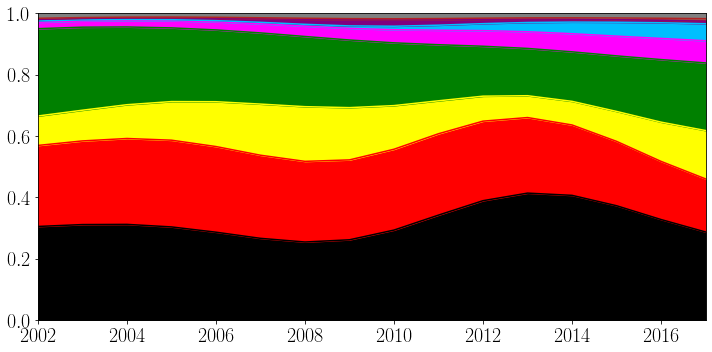

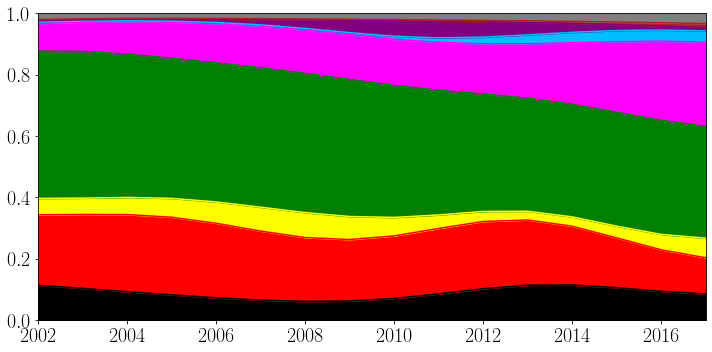

In [20]:
sm_cum_results = [sm_cumulative_Markt, sm_cumulative_Wanne, sm_cumulative_Franz]

filenames = ['sm_Markt_cum.pdf', 'sm_Wanne_cum.pdf', 'sm_Franz_cum.pdf']

for i in range(len(sm_cum_results)):
    
    r = sm_cum_results[i]
    plot_elections_cum(r, save=False, x=T_x, parties=parties, party_colors=party_colors, filename=filenames[i], legend=False)

In [21]:
# data prep for the GP+LM samples

election_GP_samples_show = out["spost_show"]
print(election_GP_samples_show.shape)

election_GP_samples_show = election_GP_samples_show.reshape((n_GP_samples_show,-1, n_regions*n_parties))
print(election_GP_samples_show.shape)

Tübingen_pred_Markt_GP_show_s = election_GP_samples_show[:, :, :n_parties]
Tübingen_pred_Wanne_GP_show_s = election_GP_samples_show[:, :, n_parties:2*n_parties]
Tübingen_pred_Franz_GP_show_s = election_GP_samples_show[:, :, 2*n_parties:3*n_parties]

sm_results_Markt_GP_show_s = np.array([softmax_batch(s_i) for s_i in Tübingen_pred_Markt_GP_show_s]) 
sm_cumulative_Markt_GP_show_s = np.cumsum(sm_results_Markt_GP_show_s, 2)

sm_results_Wanne_GP_show_s = np.array([softmax_batch(s_i) for s_i in Tübingen_pred_Wanne_GP_show_s]) 
sm_cumulative_Wanne_GP_show_s = np.cumsum(sm_results_Wanne_GP_show_s, 2)

sm_results_Franz_GP_show_s = np.array([softmax_batch(s_i) for s_i in Tübingen_pred_Franz_GP_show_s]) 
sm_cumulative_Franz_GP_show_s = np.cumsum(sm_results_Franz_GP_show_s, 2)

print(np.shape(sm_results_Markt_GP_show_s))
print(np.shape(sm_cumulative_Markt_GP_show_s))

(50, 432)
(50, 16, 27)
(50, 16, 9)
(50, 16, 9)


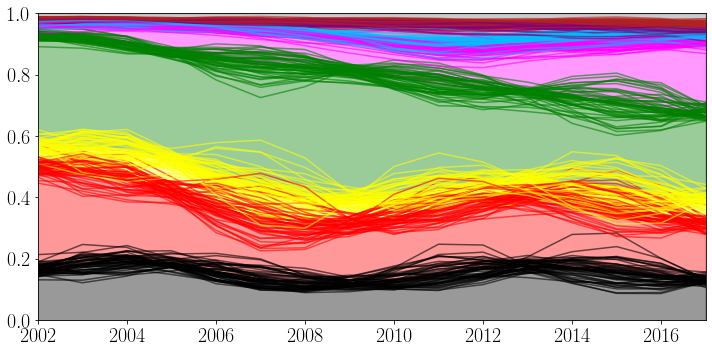

In [22]:
# plot samples

plot_elections_cum_samples(sm_cumulative_Markt_GP_show_s, x=T_x, parties=parties, party_colors=party_colors, save=False, filename='elections_GP_samples.pdf', legend=False)

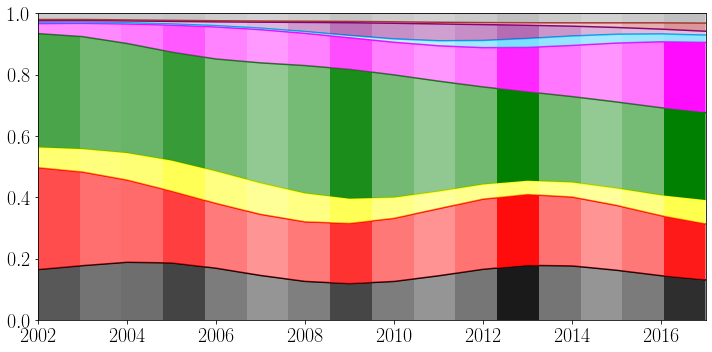

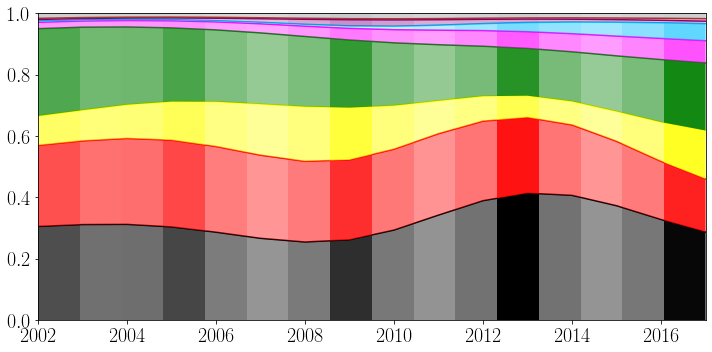

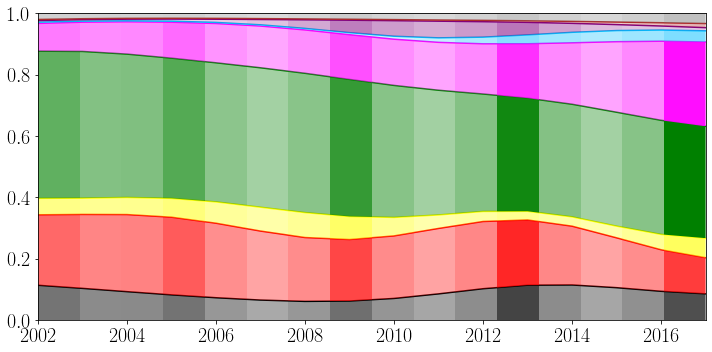

In [23]:
sm_cum_results = [sm_cumulative_Markt, sm_cumulative_Wanne, sm_cumulative_Franz]

filenames2 = ['sm_Markt_cum.pdf', 'sm_Wanne_cum.pdf', 'sm_Franz_cum.pdf']

for i in range(len(sm_cum_results)):
    
    r = sm_cum_results[i]
    v = np.sqrt(results_v[i])
    plot_elections_cum_std(r, v, x=T_x, parties=parties, party_colors=party_colors, save=False, filename=filenames2[i], legend=False)
    

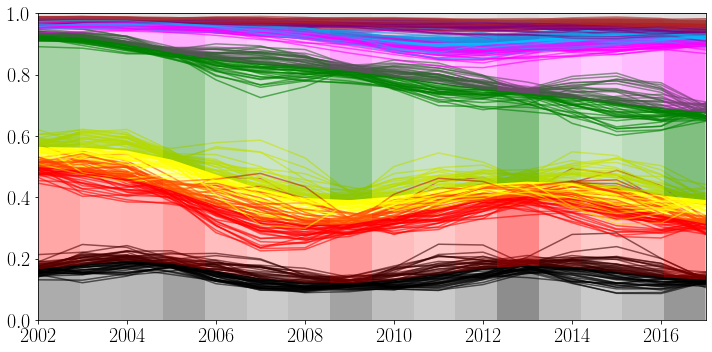

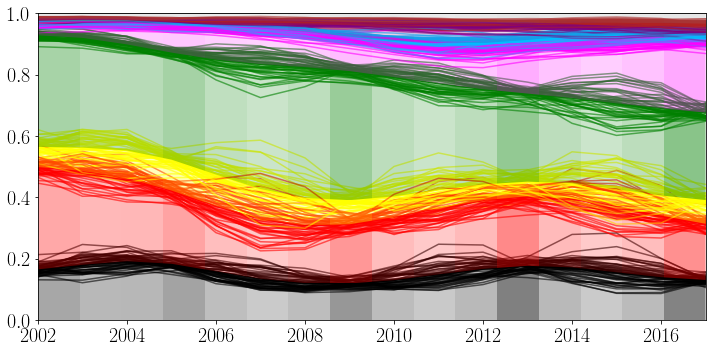

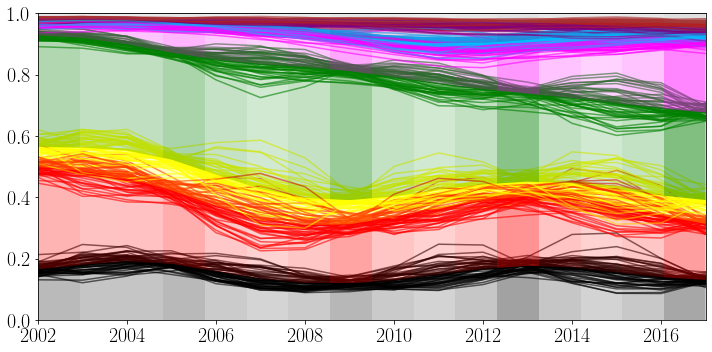

In [24]:
sm_cum_results_samples = [sm_cumulative_Markt_GP_show_s, sm_cumulative_Markt_GP_show_s, sm_cumulative_Markt_GP_show_s]

filenames2 = ['sm_Markt_cum_std_samples.png', 'sm_Wanne_cum_samples.png', 'sm_Franz_cum_samples.png']

for i in range(len(sm_cum_results_samples)):
    
    r = sm_cum_results_samples[i]
    v = np.sqrt(results_v[i])
    plot_elections_cum_samples_std(r, v, x=T_x, parties=parties,party_colors=party_colors,
                                   save=True, filename=filenames2[i], legend=False)
    

# Compare this to elliptical slice sampling

In [26]:
# apply the ESS algorithm to get samples

y_values = medium_df.reset_index(drop=True).values

from scipy.special import logsumexp

# define the log-likelihood as log prod_t prod_c prod_p softmax(f(t,c))[p]^y[t,c,p]
# we can pull the log in to get sums and logsumexps for the softmax

def log_likelihood(x, y=y_values, n_parties=n_parties):
    """
    x: current prediction
    y: true counts for elections
    n_parties: number of parties. In our example usually 9.
    """
    
    #reshape the vector such that we have p columns for the parties and every row is one [t,c]
    x_ = x.reshape(-1, n_parties)
    y_ = y.reshape(-1, n_parties)
    
    #apply the log softmax to all rows in parallel
    x_sm = x_ - logsumexp(x_, axis=1).reshape(-1, 1)
    
    #take all softmax points to the power of the corresponding vote count y
    x_sm_y = x_sm * y_
    
    #return the sum over everything as the log-likelihood
    return(np.sum(x_sm_y))

n_samples = 10000
burn_in = 1000

"""
# draw the first f_x from our prior GP with mean 0 and Cov k_XX
f_x = multivariate_normal(
    np.zeros(n), K_XX, size=1
).T
"""

# 'cheat' by choosing the init from the true observed probabilities
y_norm = np.array(y_values/y_values.sum(1).reshape(-1,1), dtype=float) + 10e-8 # <- to prevent the 0s
log_ = np.log(y_norm)
f_x = log_ - log_.sum(1).reshape(-1,1)
f_x = f_x.reshape(-1)

L = np.linalg.cholesky(G_)

post_samples_1 = np.zeros((1, n))
post_samples_2 = np.zeros((2, n))
post_samples_3 = np.zeros((3, n))
post_samples_4 = np.zeros((4, n))
post_samples_5 = np.zeros((5, n))
post_samples_10 = np.zeros((10, n))
post_samples_50 = np.zeros((50, n))
post_samples_100 = np.zeros((100, n))
post_samples_500 = np.zeros((500, n))
post_samples_1k = np.zeros((1000, n))
post_samples_2k = np.zeros((2000, n))
post_samples_3k = np.zeros((3000, n))
post_samples_4k = np.zeros((4000, n))
post_samples_5k = np.zeros((5000, n))
post_samples_6k = np.zeros((6000, n))
post_samples_7k = np.zeros((7000, n))
post_samples_8k = np.zeros((8000, n))
post_samples_9k = np.zeros((9000, n))
post_samples_10k = np.zeros((10000, n))

print("L: ", np.shape(L))

t0 = time.time()
# get many samples with ESS
for i in range(-burn_in, n_samples):
    #sample one sample
    f_x, ll = elliptical_slice(initial_theta=f_x, prior=L, lnpdf=log_likelihood) 
    if i % 100 == 0: 
            print("iteration: ", i)
            print("log-likelihood: ", ll)
    if i >= 0:
        post_samples_10k[i] = f_x
        if i < 1: post_samples_1[i] = f_x
        if i < 2: post_samples_2[i] = f_x
        if i < 3: post_samples_3[i] = f_x
        if i < 4: post_samples_4[i] = f_x
        if i < 5: post_samples_5[i] = f_x
        if i < 10: post_samples_10[i] = f_x
        if i < 50: post_samples_50[i] = f_x
        if i < 100: post_samples_100[i] = f_x
        if i < 500: post_samples_500[i] = f_x
        if i < 1000: post_samples_1k[i] = f_x
        if i < 2000: post_samples_2k[i] = f_x
        if i < 3000: post_samples_3k[i] = f_x
        if i < 4000: post_samples_4k[i] = f_x
        if i < 5000: post_samples_5k[i] = f_x
        if i < 6000: post_samples_6k[i] = f_x
        if i < 7000: post_samples_7k[i] = f_x
        if i < 8000: post_samples_8k[i] = f_x
        if i < 9000: post_samples_9k[i] = f_x
        
t1 = time.time()
print("time to take samples: ", t1-t0)



L:  (135, 135)
iteration:  -1000
log-likelihood:  -14179.58104653091
iteration:  -900
log-likelihood:  -14199.930141202134
iteration:  -800
log-likelihood:  -14210.73589233942
iteration:  -700
log-likelihood:  -14208.037508037009
iteration:  -600
log-likelihood:  -14212.789815665827
iteration:  -500
log-likelihood:  -14214.438477878615
iteration:  -400
log-likelihood:  -14219.634148174331
iteration:  -300
log-likelihood:  -14214.646288897877
iteration:  -200
log-likelihood:  -14211.574394481682
iteration:  -100
log-likelihood:  -14216.194778897638
iteration:  0
log-likelihood:  -14213.497718683459
iteration:  100
log-likelihood:  -14209.161651167562
iteration:  200
log-likelihood:  -14210.912301101167
iteration:  300
log-likelihood:  -14220.043319598875
iteration:  400
log-likelihood:  -14220.681640868408
iteration:  500
log-likelihood:  -14223.39153422944
iteration:  600
log-likelihood:  -14224.938266381112
iteration:  700
log-likelihood:  -14225.270674541745
iteration:  800
log-likel

In [75]:
# timing for one sample
times = []
for i in range(10):
    t_0 = time.time()
    _, _ = elliptical_slice(initial_theta=f_x, prior=L, lnpdf=log_likelihood) 
    t_1 = time.time()
    t_one_sample_ = t_1 - t_0
    print("Time for one sample: {:.04f}".format(t_one_sample_))
    times.append(t_one_sample_)
    
t_one_sample = np.mean(times)
one_sample_ratio = t_LM/t_one_sample
    
# compare to time for LM:
#mu transformation time:  0.0023086071014404297
#Sigma transformation time:  0.0020904541015625
t_LM = 0.0023086071014404297 + 0.0020904541015625
print("Time for LM: {:.04f}".format(t_LM))
print("Fraction of one sample vs LM: {:.03f}".format(one_sample_ratio))

Time for one sample: 0.0066
Time for one sample: 0.0014
Time for one sample: 0.0018
Time for one sample: 0.0044
Time for one sample: 0.0036
Time for one sample: 0.0048
Time for one sample: 0.0033
Time for one sample: 0.0009
Time for one sample: 0.0014
Time for one sample: 0.0040
Time for LM: 0.0044
Fraction of one sample vs LM: 1.374


In [39]:
def pred_samples_sm_cum(samples, all=False):
    
    if all: 
        pred_samples_sm_cum_all = []
        
        for s in samples:
            
            s = s.reshape((-1, n_parties))
            sm_s = softmax_batch(s)
            sm_s_cum = np.cumsum(sm_s, 1)
        
            pred_samples_sm_cum_all.append(sm_s_cum)
        
        return(np.array(pred_samples_sm_cum_all))
    
    else: 
        
        pred_samples_Markt_sm_cum = []
        pred_samples_Wanne_sm_cum = []
        pred_samples_Franz_sm_cum = []
        
        for s in samples:

            s = s.reshape((-1, n_regions*n_parties))

            sample_pred_Markt = s[:, :n_parties]
            sample_pred_Wanne = s[:, n_parties:2*n_parties]
            sample_pred_Franz = s[:, 2*n_parties:3*n_parties]

            sm_s_results_Markt = softmax_batch(sample_pred_Markt)
            sm_s_cumulative_Markt = np.cumsum(sm_s_results_Markt, 1)

            sm_s_results_Wanne = softmax_batch(sample_pred_Wanne)
            sm_s_cumulative_Wanne = np.cumsum(sm_s_results_Wanne, 1)

            sm_s_results_Franz = softmax_batch(sample_pred_Franz)
            sm_s_cumulative_Franz = np.cumsum(sm_s_results_Franz, 1)

            pred_samples_Markt_sm_cum.append(sm_s_cumulative_Markt)
            pred_samples_Wanne_sm_cum.append(sm_s_cumulative_Wanne)
            pred_samples_Franz_sm_cum.append(sm_s_cumulative_Franz)

        pred_samples_Markt_sm_cum = np.array(pred_samples_Markt_sm_cum)
        pred_samples_Wanne_sm_cum = np.array(pred_samples_Wanne_sm_cum)
        pred_samples_Franz_sm_cum = np.array(pred_samples_Franz_sm_cum)

        return(pred_samples_Markt_sm_cum,
               pred_samples_Wanne_sm_cum,
               pred_samples_Franz_sm_cum)
    
def pred_samples_sm(samples, all=False):
    
    
    if all: 
        pred_samples_sm_all = []
        
        for s in samples:
            
            s = s.reshape((-1, n_parties))
            sm_s = softmax_batch(s)
        
            pred_samples_sm_all.append(sm_s)
        
        return(np.array(pred_samples_sm_all))
    
    else: 
        
        pred_samples_Markt_sm = []
        pred_samples_Wanne_sm = []
        pred_samples_Franz_sm = []
        
        for s in samples:

            s = s.reshape((-1, n_regions*n_parties))

            sample_pred_Markt = s[:, :n_parties]
            sample_pred_Wanne = s[:, n_parties:2*n_parties]
            sample_pred_Franz = s[:, 2*n_parties:3*n_parties]

            sm_s_results_Markt = softmax_batch(sample_pred_Markt)

            sm_s_results_Wanne = softmax_batch(sample_pred_Wanne)

            sm_s_results_Franz = softmax_batch(sample_pred_Franz)

            pred_samples_Markt_sm.append(sm_s_results_Markt)
            pred_samples_Wanne_sm.append(sm_s_results_Wanne)
            pred_samples_Franz_sm.append(sm_s_results_Franz)

        pred_samples_Markt_sm = np.array(pred_samples_Markt_sm)
        pred_samples_Wanne_sm = np.array(pred_samples_Wanne_sm)
        pred_samples_Franz_sm = np.array(pred_samples_Franz_sm)

        return(pred_samples_Markt_sm,
               pred_samples_Wanne_sm,
               pred_samples_Franz_sm)

In [40]:
# project the samples into the prediction space
ESS_pred_10k = np.array([A @ S for S in post_samples_10k])
ESS_pred_10k_sm_cum = pred_samples_sm_cum(ESS_pred_10k, all=True)
ESS_pred_10k_Markt_sm_cum, ESS_pred_10k_Wanne_sm_cum, ESS_pred_10k_Franz_sm_cum = pred_samples_sm_cum(ESS_pred_10k, all=False)
ESS_pred_10k_Markt_sm, ESS_pred_10k_Wanne_sm, ESS_pred_10k_Franz_sm = pred_samples_sm(ESS_pred_10k, all=False)
print(np.shape(ESS_pred_10k_sm_cum))
print(np.shape(ESS_pred_10k_Markt_sm_cum))
print(np.shape(ESS_pred_10k_Markt_sm))

(10000, 48, 9)
(10000, 16, 9)
(10000, 16, 9)


In [41]:
# for all 10k samples draw one sample that from a Gaussian with the sample as mean
# and the Kernel from the top as Covariance matrix

ESS_pred_10k_Gaussian = []
for s in ESS_pred_10k:
    ESS_pred_10k_Gaussian.append(multivariate_normal(s.flatten(), out["vpost"], size=1))
                                 
ESS_pred_10k_Gaussian = np.array(ESS_pred_10k_Gaussian).reshape(np.shape(ESS_pred_10k))
print(np.shape(ESS_pred_10k_Gaussian))

(10000, 432)


In [42]:
ESS_pred_10k_Markt_sm_cum_Gaussian, ESS_pred_10k_Wanne_sm_cum_Gaussian, ESS_pred_10k_Franz_sm_cum_Gaussian = pred_samples_sm_cum(ESS_pred_10k_Gaussian, all=False)
ESS_pred_10k_Markt_sm_Gaussian, ESS_pred_10k_Wanne_sm_Gaussian, ESS_pred_10k_Franz_sm_Gaussian = pred_samples_sm(ESS_pred_10k_Gaussian, all=False)
print(np.shape(ESS_pred_10k_Markt_sm_cum_Gaussian))
print(np.shape(ESS_pred_10k_Markt_sm_Gaussian))

(10000, 16, 9)
(10000, 16, 9)


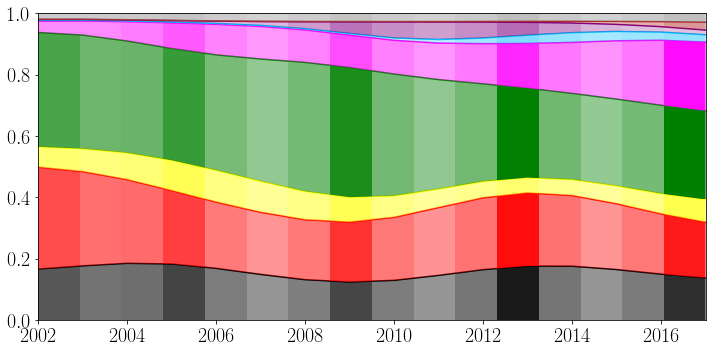

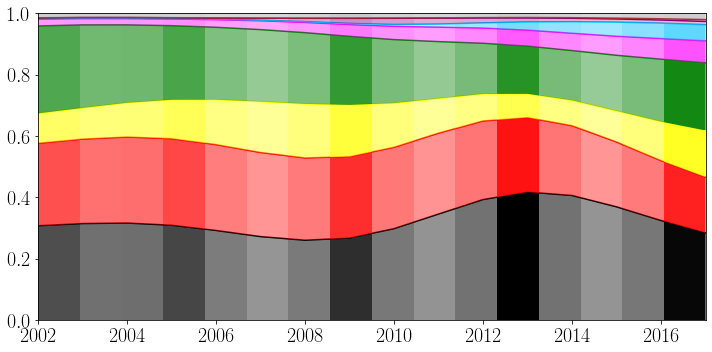

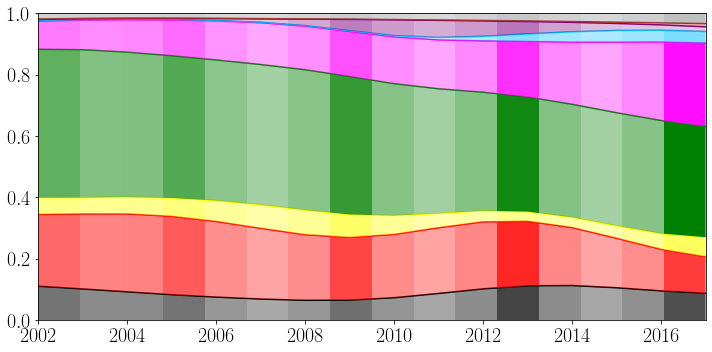

In [43]:
ESS_pred_Markt = ESS_pred_10k_Markt_sm_cum_Gaussian.mean(0)
ESS_pred_Wanne = ESS_pred_10k_Wanne_sm_cum_Gaussian.mean(0)
ESS_pred_Franz = ESS_pred_10k_Franz_sm_cum_Gaussian.mean(0)

ESS_pred_Markt_std = ESS_pred_10k_Markt_sm_cum_Gaussian.std(0)
ESS_pred_Wanne_std = ESS_pred_10k_Wanne_sm_cum_Gaussian.std(0)
ESS_pred_Franz_std = ESS_pred_10k_Franz_sm_cum_Gaussian.std(0)

plot_elections_cum_std(ESS_pred_Markt, np.sqrt(results_v[0]), x=T_x, parties=parties, party_colors=party_colors, save=False, filename='delete.png', legend=False)
plot_elections_cum_std(ESS_pred_Wanne, np.sqrt(results_v[1]), x=T_x, parties=parties, party_colors=party_colors, save=False, filename='delete.png', legend=False)
plot_elections_cum_std(ESS_pred_Franz, np.sqrt(results_v[2]), x=T_x, parties=parties, party_colors=party_colors, save=False, filename='delete.png', legend=False)

In [44]:
print(np.shape(ESS_pred_10k_Markt_sm_cum_Gaussian))
ESS_pred_10k_Markt_sm_cum_Gaussian_2004 = ESS_pred_10k_Markt_sm_cum_Gaussian[:, 2, :]
ESS_pred_10k_Markt_sm_Gaussian_2004 = ESS_pred_10k_Markt_sm_Gaussian[:, 2, :]
print(np.shape(ESS_pred_10k_Markt_sm_cum_Gaussian_2004))

(10000, 16, 9)
(10000, 9)


## Compare the marginal predictions of LM with LM+GP-samples and ESS samples

In [45]:
# Make inline plots vector graphics
from IPython.display import set_matplotlib_formats

set_matplotlib_formats("pdf", "svg")

#matplotlib.rc("font", **{"family": "serif", "serif": ["Times Roman"]})
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["text.usetex"] = True
plt.rcParams["text.latex.preamble"] = r"\usepackage{amsfonts} \usepackage{amsmath}"

In [46]:
election_GP_samples = out['spost']

LM_GP_pred_10k_Markt_sm, LM_GP_pred_10k_Wanne_sm, LM_GP_pred_10k_Franz_sm = pred_samples_sm(election_GP_samples, all=False)
print(np.shape(LM_GP_pred_10k_Markt_sm))

(10000, 16, 9)


In [47]:
mu_pred_all = out["mpost"].reshape((-1, n_regions*n_parties))

mu_pred_Markt = mu_pred_all[:, :n_parties]
mu_pred_Wanne = mu_pred_all[:, n_parties:2*n_parties]
mu_pred_Franz = mu_pred_all[:, 2*n_parties:3*n_parties]

In [48]:
# plotting function for marginal betas vs. samples
from scipy.stats import beta

def plot_marginal_betas_vs_samples(region, year, title, filename='test.tex', save=False, tex=False):

    assert(region in ["Markt", "Wanne", "Franz"])
    
    year_number = year - 2002
    
    if region == "Markt":
        ESS_pred_10k_sm_Gaussian = ESS_pred_10k_Markt_sm_Gaussian[:, year_number, :]
        LM_GP_pred_10k_sm = LM_GP_pred_10k_Markt_sm[:, year_number, :]
        mu_pred_ = mu_pred_Markt[year_number, :]
        region_number = 0
    elif region == "Wanne":
        ESS_pred_10k_sm_Gaussian = ESS_pred_10k_Wanne_sm_Gaussian[:, year_number, :]
        LM_GP_pred_10k_sm = LM_GP_pred_10k_Wanne_sm[:, year_number, :]
        mu_pred_ = mu_pred_Wanne[year_number, :]
        region_number = 1
    elif region == "Franz":
        ESS_pred_10k_sm_Gaussian = ESS_pred_10k_Franz_sm_Gaussian[:, year_number, :]
        LM_GP_pred_10k_sm = LM_GP_pred_10k_Franz_sm[:, year_number, :]
        mu_pred_ = mu_pred_Franz[year_number, :]
        region_number = 2
    
    assert(np.allclose(out["mpost"][(year_number*n_regions+region_number)*n_parties:(year_number*n_regions+region_number+1)*n_parties], mu_pred_))

    Sigma_pred = out["vpost"][(year_number*n_regions+region_number)*n_parties:(year_number*n_regions+region_number+1)*n_parties, 
                              (year_number*n_regions+region_number)*n_parties:(year_number*n_regions+region_number+1)*n_parties]

    alphas_pred = Dirichlet_bridge_alpha(mu=mu_pred_, Sigma=Sigma_pred)

    alpha_sum = alphas_pred.sum()
    alpha_0, beta_0 = alphas_pred[0], alpha_sum - alphas_pred[0]
    alpha_1, beta_1 = alphas_pred[1], alpha_sum - alphas_pred[1]
    alpha_2, beta_2 = alphas_pred[2], alpha_sum - alphas_pred[2]
    alpha_3, beta_3 = alphas_pred[3], alpha_sum - alphas_pred[3]
    alpha_4, beta_4 = alphas_pred[4], alpha_sum - alphas_pred[4]


    x_beta = np.linspace(0, 1, 1000+1)
    beta_func_0 = beta.pdf(x_beta, alpha_0, beta_0)
    beta_func_1 = beta.pdf(x_beta, alpha_1, beta_1)
    beta_func_2 = beta.pdf(x_beta, alpha_2, beta_2)
    beta_func_3 = beta.pdf(x_beta, alpha_3, beta_3)
    #beta_func_4 = beta.pdf(x_beta, alpha_4, beta_4)

    fig = plt.figure(figsize=(10, 4))
    plt.xlim(0, 0.5)
    #plt.yticklabels([])
    plt.yticks([])
    plt.ylabel('$p(p_i)$')
    plt.xlabel('$p_i$')
    
    plt.rc('text', usetex=True)
    plt.rc('ytick', labelsize=15)
    plt.rc('xtick', labelsize=15)
    plt.rc('axes', labelsize=15)

    alpha_ESS = 0.7
    alpha_GP = 0.3

    LM_GP_colors = ['pink', 'gold', 'navy', 'aqua']

    #plt.title(title)

    
    plt.hist(LM_GP_pred_10k_sm[:,0], density=True, alpha=alpha_GP, bins=100, color=LM_GP_colors[0])
    plt.hist(LM_GP_pred_10k_sm[:,1], density=True, alpha=alpha_GP, bins=100, color=LM_GP_colors[1])
    plt.hist(LM_GP_pred_10k_sm[:,2], density=True, alpha=alpha_GP, bins=100, color=LM_GP_colors[2])
    plt.hist(LM_GP_pred_10k_sm[:,3], density=True, alpha=alpha_GP, bins=100, color=LM_GP_colors[3])
    #plt.hist(LM_GP_pred_10k_sm[:,4], density=True, alpha=alpha_GP, bins=100, color=LM_GP_colors[4])
    
    plt.hist(ESS_pred_10k_sm_Gaussian[:,0], density=True, alpha=alpha_ESS, bins=100, color=party_colors[parties[0]])
    plt.hist(ESS_pred_10k_sm_Gaussian[:,1], density=True, alpha=alpha_ESS, bins=100, color=party_colors[parties[1]])
    plt.hist(ESS_pred_10k_sm_Gaussian[:,2], density=True, alpha=alpha_ESS, bins=100, color=party_colors[parties[2]])
    plt.hist(ESS_pred_10k_sm_Gaussian[:,3], density=True, alpha=alpha_ESS, bins=100, color=party_colors[parties[3]])
    #plt.hist(ESS_pred_10k_sm_Gaussian[:,4], density=True, alpha=alpha_ESS, bins=100, color=party_colors[parties[4]])

    plt.plot(x_beta, beta_func_0, color=party_colors[parties[0]])
    plt.plot(x_beta, beta_func_1, color=party_colors[parties[1]])
    plt.plot(x_beta, beta_func_2, color=party_colors[parties[2]])
    plt.plot(x_beta, beta_func_3, color=party_colors[parties[3]])
    #plt.plot(x_beta, beta_func_4, color=party_colors[parties[4]])
    
    plt.tight_layout()
    if save and tex:
        tpl.save(
            filename,
            figure = fig,
            axis_width = "\\figwidth",
            axis_height= "\\figheight",
            tex_relative_path_to_data=".",
            override_externals=True,
            float_format=".3g"
        )
    elif save:
        plt.savefig(filename)
    
    plt.show();

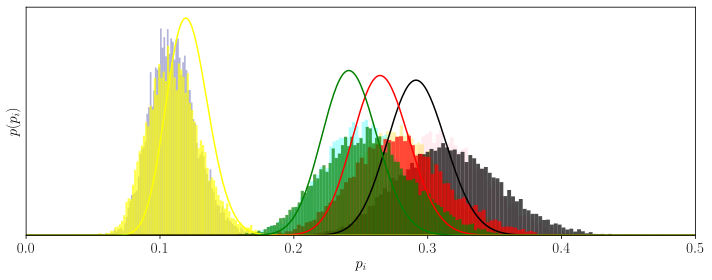

In [47]:
plot_marginal_betas_vs_samples(region='Wanne', year=2004, title='Wanne 2004', filename='Wanne_2004.tex', save=True, tex=True)

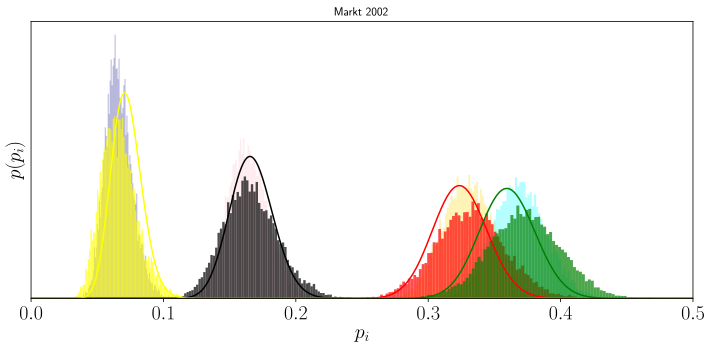

In [36]:
plot_marginal_betas_vs_samples(region='Markt', year=2002, title='Markt 2002', filename='delete.pdf', save=False)
plot_marginal_betas_vs_samples(region='Markt', year=2003, title='Markt 2003', filename='delete.pdf', save=False)
plot_marginal_betas_vs_samples(region='Markt', year=2004, title='Markt 2004', filename='delete.pdf', save=False)
plot_marginal_betas_vs_samples(region='Markt', year=2005, title='Markt 2005', filename='delete.pdf', save=False)
plot_marginal_betas_vs_samples(region='Markt', year=2006, title='Markt 2006', filename='delete.pdf', save=False)
plot_marginal_betas_vs_samples(region='Markt', year=2007, title='Markt 2007', filename='delete.pdf', save=False)
plot_marginal_betas_vs_samples(region='Markt', year=2008, title='Markt 2008', filename='delete.pdf', save=False)
plot_marginal_betas_vs_samples(region='Markt', year=2009, title='Markt 2009', filename='delete.pdf', save=False)

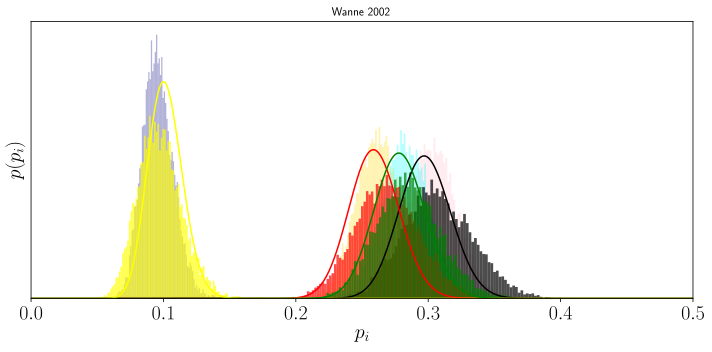

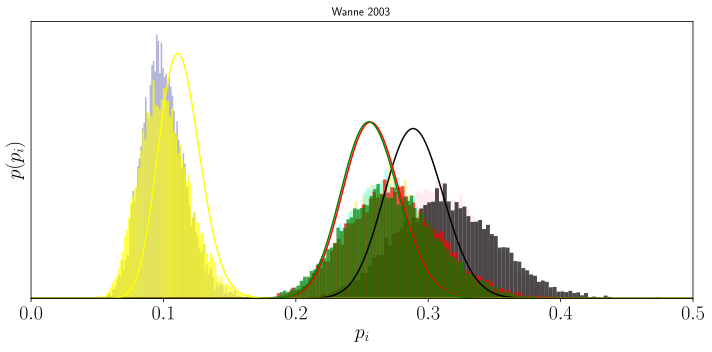

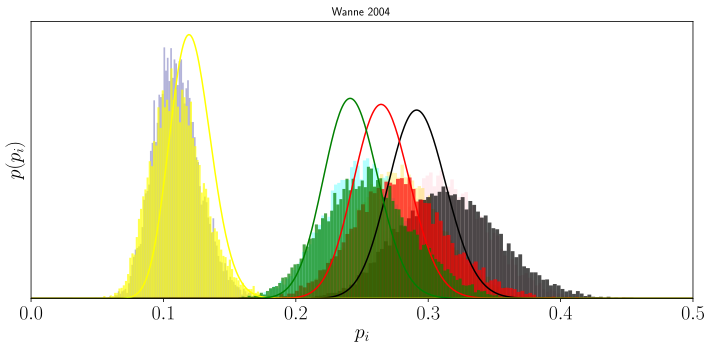

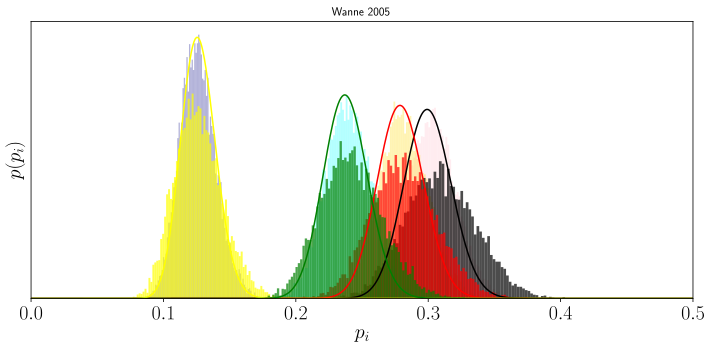

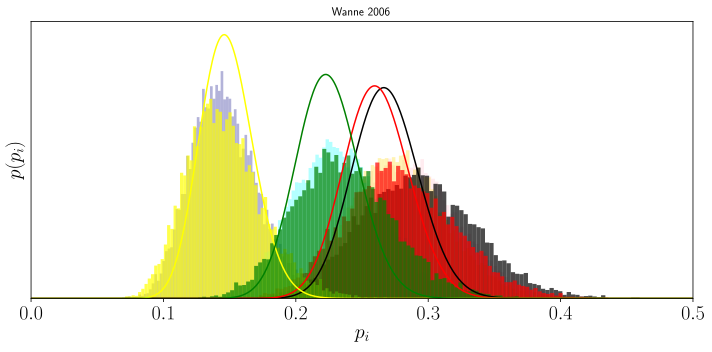

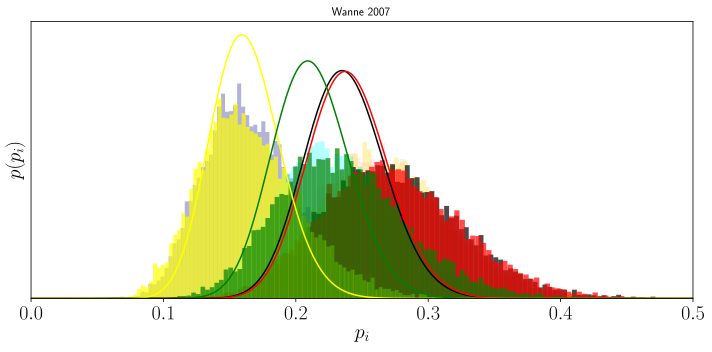

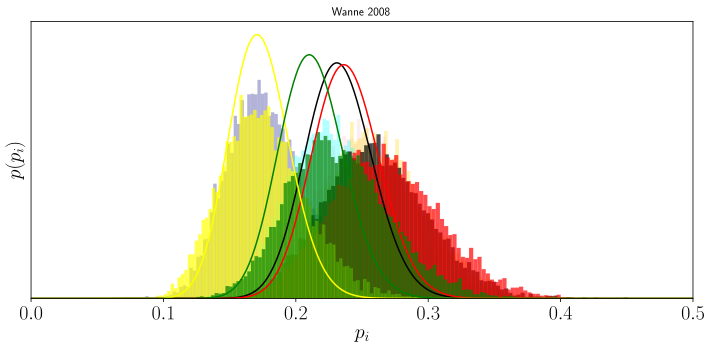

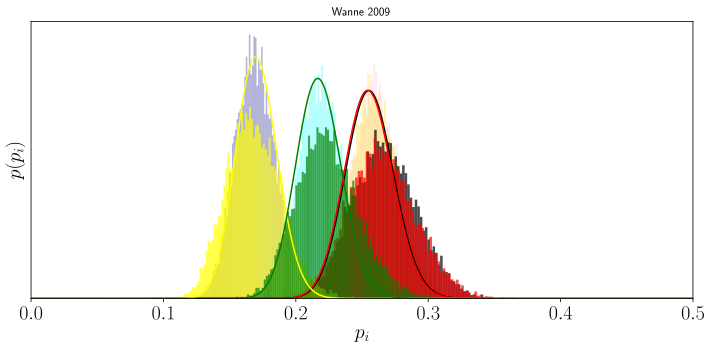

In [44]:
plot_marginal_betas_vs_samples(region='Wanne', year=2002, title='Wanne 2002', filename='delete.pdf', save=False)
plot_marginal_betas_vs_samples(region='Wanne', year=2003, title='Wanne 2003', filename='delete.pdf', save=False)
plot_marginal_betas_vs_samples(region='Wanne', year=2004, title='Wanne 2004', filename='delete.pdf', save=False)
plot_marginal_betas_vs_samples(region='Wanne', year=2005, title='Wanne 2005', filename='delete.pdf', save=False)
plot_marginal_betas_vs_samples(region='Wanne', year=2006, title='Wanne 2006', filename='delete.pdf', save=False)
plot_marginal_betas_vs_samples(region='Wanne', year=2007, title='Wanne 2007', filename='delete.pdf', save=False)
plot_marginal_betas_vs_samples(region='Wanne', year=2008, title='Wanne 2008', filename='delete.pdf', save=False)
plot_marginal_betas_vs_samples(region='Wanne', year=2009, title='Wanne 2009', filename='delete.pdf', save=False)

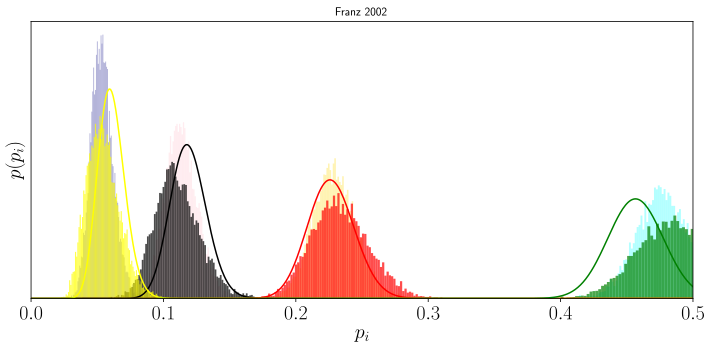

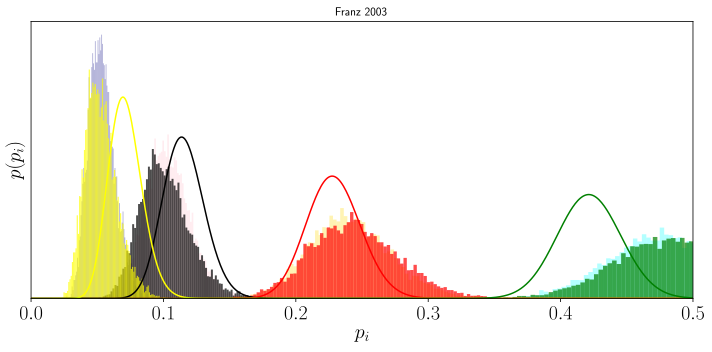

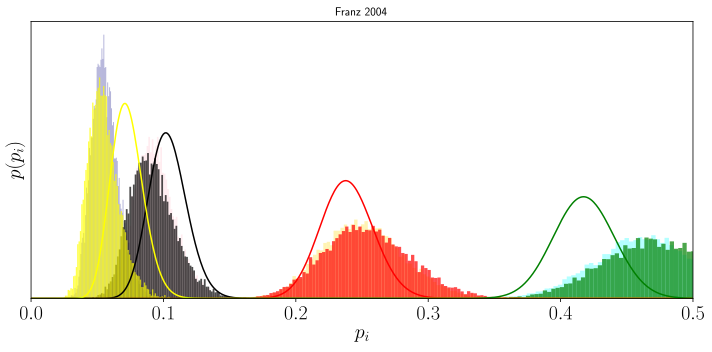

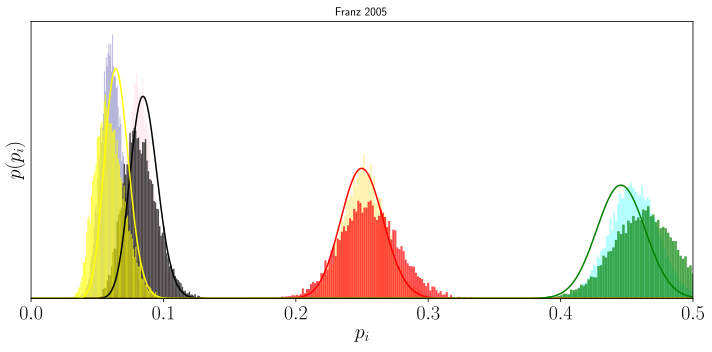

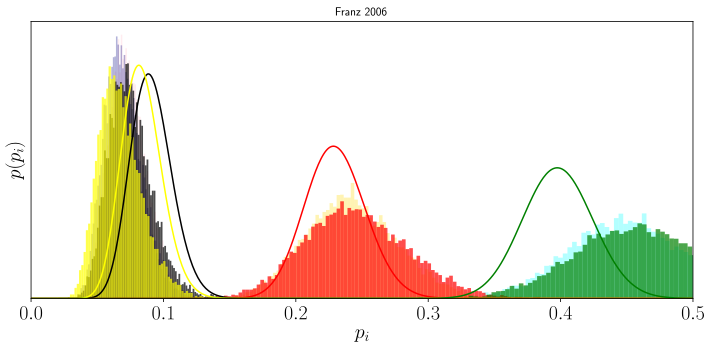

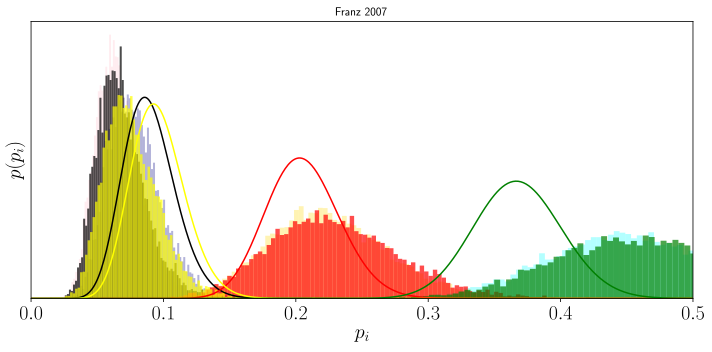

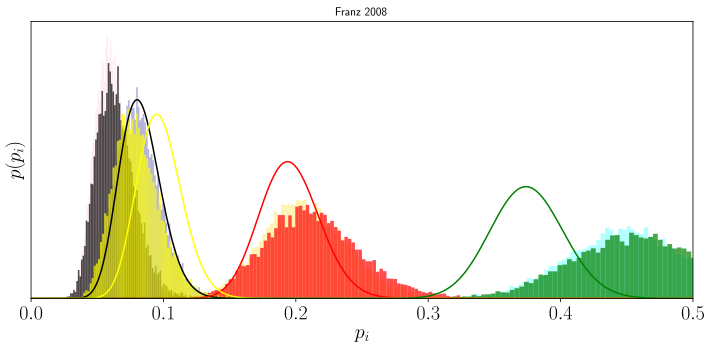

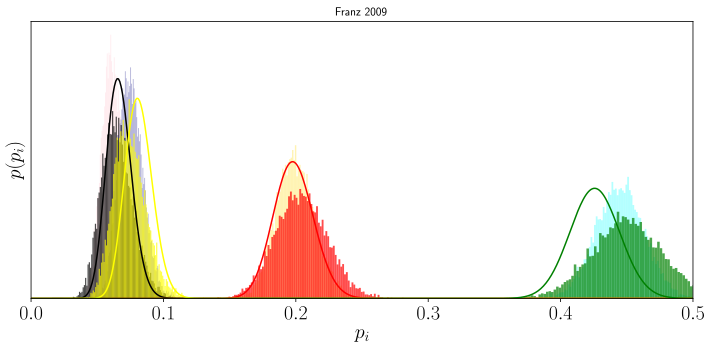

In [45]:
plot_marginal_betas_vs_samples(region='Franz', year=2002, title='Franz 2002', filename='delete.pdf', save=False)
plot_marginal_betas_vs_samples(region='Franz', year=2003, title='Franz 2003', filename='delete.pdf', save=False)
plot_marginal_betas_vs_samples(region='Franz', year=2004, title='Franz 2004', filename='delete.pdf', save=False)
plot_marginal_betas_vs_samples(region='Franz', year=2005, title='Franz 2005', filename='delete.pdf', save=False)
plot_marginal_betas_vs_samples(region='Franz', year=2006, title='Franz 2006', filename='delete.pdf', save=False)
plot_marginal_betas_vs_samples(region='Franz', year=2007, title='Franz 2007', filename='delete.pdf', save=False)
plot_marginal_betas_vs_samples(region='Franz', year=2008, title='Franz 2008', filename='delete.pdf', save=False)
plot_marginal_betas_vs_samples(region='Franz', year=2009, title='Franz 2009', filename='delete.pdf', save=False)

# Compare accuracy on actual election outcomes
i.e. no predictions, only training data. 

In [49]:
def training_samples_sm_cum(samples, all=False):
    
    training_samples_Markt_sm_cum = []
    training_samples_Wanne_sm_cum = []
    training_samples_Franz_sm_cum = []

    if all: 
        training_samples_sm_cum_all = []
        
        for s in samples:
            
            s = s.reshape((-1, n_parties))
            sm_s = softmax_batch(s)
            sm_s_cum = np.cumsum(sm_s, 1)
        
            training_samples_sm_cum_all.append(sm_s_cum)
        
        return(np.array(training_samples_sm_cum_all))
    
    else: 
        for s in samples:

            s = s.reshape((-1, n_regions*n_parties))

            sample_pred_Markt = s[:, :n_parties]
            sample_pred_Wanne = s[:, n_parties:2*n_parties]
            sample_pred_Franz = s[:, 2*n_parties:3*n_parties]

            sm_s_results_Markt = softmax_batch(sample_pred_Markt)
            sm_s_cumulative_Markt = np.cumsum(sm_s_results_Markt, 1)

            sm_s_results_Wanne = softmax_batch(sample_pred_Wanne)
            sm_s_cumulative_Wanne = np.cumsum(sm_s_results_Wanne, 1)

            sm_s_results_Franz = softmax_batch(sample_pred_Franz)
            sm_s_cumulative_Franz = np.cumsum(sm_s_results_Franz, 1)

            training_samples_Markt_sm_cum.append(sm_s_cumulative_Markt)
            training_samples_Wanne_sm_cum.append(sm_s_cumulative_Wanne)
            training_samples_Franz_sm_cum.append(sm_s_cumulative_Franz)

        training_samples_Markt_sm_cum = np.array(training_samples_Markt_sm_cum)
        training_samples_Wanne_sm_cum = np.array(training_samples_Wanne_sm_cum)
        training_samples_Franz_sm_cum = np.array(training_samples_Franz_sm_cum)

        return(training_samples_Markt_sm_cum,
               training_samples_Wanne_sm_cum,
               training_samples_Franz_sm_cum)

In [50]:
training_samples_Markt_sm_cum_10k, training_samples_Wanne_sm_cum_10k, training_samples_Franz_sm_cum_10k = training_samples_sm_cum(post_samples_10k)
training_samples_All_sm_cum_10k = training_samples_sm_cum(post_samples_10k, all=True)

In [51]:
print(np.shape(training_samples_Markt_sm_cum_10k))

training_samples_Markt_sm_cum_mean_10k = np.mean(training_samples_Markt_sm_cum_10k, 0)
training_samples_Markt_sm_cum_std_10k = np.std(training_samples_Markt_sm_cum_10k, 0)

training_samples_Wanne_sm_cum_mean_10k = np.mean(training_samples_Wanne_sm_cum_10k, 0)
training_samples_Wanne_sm_cum_std_10k = np.std(training_samples_Wanne_sm_cum_10k, 0)

training_samples_Franz_sm_cum_mean_10k = np.mean(training_samples_Franz_sm_cum_10k, 0)
training_samples_Franz_sm_cum_std_10k = np.std(training_samples_Franz_sm_cum_10k, 0)

training_samples_All_sm_cum_mean_10k = np.mean(training_samples_All_sm_cum_10k, 0)
training_samples_All_sm_cum_std_10k = np.std(training_samples_All_sm_cum_10k, 0)

print(np.shape(training_samples_All_sm_cum_mean_10k))

(10000, 5, 9)
(15, 9)


## compare to Laplace Matching

In [52]:
n_GP_train_samples = 10000
train_GP_samples = multivariate_normal(
    Y_mu.flatten(), Y_Sigma_block, size=n_GP_train_samples
)

In [53]:
Y_mu_ = Y_mu.reshape((-1, n_regions*n_parties))
    
GP_mean_train_Markt = Y_mu_[:, :n_parties]
GP_mean_train_Wanne = Y_mu_[:, n_parties:2*n_parties]
GP_mean_train_Franz = Y_mu_[:, 2*n_parties:3*n_parties]

sm_GP_train_results_Markt = softmax_batch(GP_mean_train_Markt)
sm_GP_train_cumulative_Markt = np.cumsum(sm_GP_train_results_Markt, 1)

sm_GP_train_results_Wanne = softmax_batch(GP_mean_train_Wanne)
sm_GP_train_cumulative_Wanne = np.cumsum(sm_GP_train_results_Wanne, 1)

sm_GP_train_results_Franz = softmax_batch(GP_mean_train_Franz)
sm_GP_train_cumulative_Franz = np.cumsum(sm_GP_train_results_Franz, 1)

sm_GP_train_results_all = softmax_batch(Y_mu_.reshape(-1, n_parties))
sm_GP_train_cumulative_all = np.cumsum(sm_GP_train_results_all, 1)

In [54]:
training_GP_samples_Markt_sm_cum_10k, training_GP_samples_Wanne_sm_cum_10k, training_GP_samples_Franz_sm_cum_10k = training_samples_sm_cum(train_GP_samples)
training_GP_samples_All_sm_cum_10k = training_samples_sm_cum(train_GP_samples, all=True)

In [55]:
print(np.shape(training_GP_samples_Markt_sm_cum_10k))

training_GP_samples_Markt_sm_cum_mean_10k = np.mean(training_GP_samples_Markt_sm_cum_10k, 0)
training_GP_samples_Markt_sm_cum_std_10k = np.std(training_GP_samples_Markt_sm_cum_10k, 0)

training_GP_samples_Wanne_sm_cum_mean_10k = np.mean(training_GP_samples_Wanne_sm_cum_10k, 0)
training_GP_samples_Wanne_sm_cum_std_10k = np.std(training_GP_samples_Wanne_sm_cum_10k, 0)

training_GP_samples_Franz_sm_cum_mean_10k = np.mean(training_GP_samples_Franz_sm_cum_10k, 0)
training_GP_samples_Franz_sm_cum_std_10k = np.std(training_GP_samples_Franz_sm_cum_10k, 0)

training_GP_samples_All_sm_cum_mean_10k = np.mean(training_GP_samples_All_sm_cum_10k, 0)
training_GP_samples_All_sm_cum_std_10k = np.std(training_GP_samples_All_sm_cum_10k, 0)

(10000, 5, 9)


# Compute the distances

In [56]:
def rmse(predictions, targets):
    return np.sqrt(((predictions - targets) ** 2).mean())

def mean_abs_diff(pred, targets):
    return(np.mean(np.abs(pred - targets)))

In [57]:
# apply the computations to all samples

training_samples_All_sm_cum_1 = training_samples_sm_cum(post_samples_1, all=True)
training_samples_All_sm_cum_2 = training_samples_sm_cum(post_samples_2, all=True)
training_samples_All_sm_cum_3 = training_samples_sm_cum(post_samples_3, all=True)
training_samples_All_sm_cum_4 = training_samples_sm_cum(post_samples_4, all=True)
training_samples_All_sm_cum_5 = training_samples_sm_cum(post_samples_5, all=True)
training_samples_All_sm_cum_10 = training_samples_sm_cum(post_samples_10, all=True)
training_samples_All_sm_cum_50 = training_samples_sm_cum(post_samples_50, all=True)
training_samples_All_sm_cum_100 = training_samples_sm_cum(post_samples_100, all=True)
training_samples_All_sm_cum_500 = training_samples_sm_cum(post_samples_500, all=True)
training_samples_All_sm_cum_1k = training_samples_sm_cum(post_samples_1k, all=True)
training_samples_All_sm_cum_2k = training_samples_sm_cum(post_samples_2k, all=True)
training_samples_All_sm_cum_3k = training_samples_sm_cum(post_samples_3k, all=True)
training_samples_All_sm_cum_4k = training_samples_sm_cum(post_samples_4k, all=True)
training_samples_All_sm_cum_5k = training_samples_sm_cum(post_samples_5k, all=True)
training_samples_All_sm_cum_6k = training_samples_sm_cum(post_samples_6k, all=True)
training_samples_All_sm_cum_7k = training_samples_sm_cum(post_samples_7k, all=True)
training_samples_All_sm_cum_8k = training_samples_sm_cum(post_samples_8k, all=True)
training_samples_All_sm_cum_9k = training_samples_sm_cum(post_samples_9k, all=True)
training_samples_All_sm_cum_10k = training_samples_sm_cum(post_samples_10k, all=True)

In [58]:
# compute mean and std for all samples

training_samples_All_sm_cum_mean_1 = np.mean(training_samples_All_sm_cum_1, 0)

training_samples_All_sm_cum_mean_2 = np.mean(training_samples_All_sm_cum_2, 0)
training_samples_All_sm_cum_std_2 = np.std(training_samples_All_sm_cum_2, 0)

training_samples_All_sm_cum_mean_3 = np.mean(training_samples_All_sm_cum_3, 0)
training_samples_All_sm_cum_std_3 = np.std(training_samples_All_sm_cum_3, 0)

training_samples_All_sm_cum_mean_4 = np.mean(training_samples_All_sm_cum_4, 0)
training_samples_All_sm_cum_std_4 = np.std(training_samples_All_sm_cum_4, 0)

training_samples_All_sm_cum_mean_5 = np.mean(training_samples_All_sm_cum_5, 0)
training_samples_All_sm_cum_std_5 = np.std(training_samples_All_sm_cum_5, 0)

training_samples_All_sm_cum_mean_10 = np.mean(training_samples_All_sm_cum_10, 0)
training_samples_All_sm_cum_std_10 = np.std(training_samples_All_sm_cum_10, 0)

training_samples_All_sm_cum_mean_50 = np.mean(training_samples_All_sm_cum_50, 0)
training_samples_All_sm_cum_std_50 = np.std(training_samples_All_sm_cum_50, 0)

training_samples_All_sm_cum_mean_100 = np.mean(training_samples_All_sm_cum_100, 0)
training_samples_All_sm_cum_std_100 = np.std(training_samples_All_sm_cum_100, 0)

training_samples_All_sm_cum_mean_500 = np.mean(training_samples_All_sm_cum_500, 0)
training_samples_All_sm_cum_std_500 = np.std(training_samples_All_sm_cum_500, 0)

training_samples_All_sm_cum_mean_1k = np.mean(training_samples_All_sm_cum_1k, 0)
training_samples_All_sm_cum_std_1k = np.std(training_samples_All_sm_cum_1k, 0)

training_samples_All_sm_cum_mean_2k = np.mean(training_samples_All_sm_cum_2k, 0)
training_samples_All_sm_cum_std_2k = np.std(training_samples_All_sm_cum_2k, 0)

training_samples_All_sm_cum_mean_3k = np.mean(training_samples_All_sm_cum_3k, 0)
training_samples_All_sm_cum_std_3k = np.std(training_samples_All_sm_cum_3k, 0)

training_samples_All_sm_cum_mean_4k = np.mean(training_samples_All_sm_cum_4k, 0)
training_samples_All_sm_cum_std_4k = np.std(training_samples_All_sm_cum_4k, 0)

training_samples_All_sm_cum_mean_5k = np.mean(training_samples_All_sm_cum_5k, 0)
training_samples_All_sm_cum_std_5k = np.std(training_samples_All_sm_cum_5k, 0)

training_samples_All_sm_cum_mean_6k = np.mean(training_samples_All_sm_cum_6k, 0)
training_samples_All_sm_cum_std_6k = np.std(training_samples_All_sm_cum_6k, 0)

training_samples_All_sm_cum_mean_7k = np.mean(training_samples_All_sm_cum_7k, 0)
training_samples_All_sm_cum_std_7k = np.std(training_samples_All_sm_cum_7k, 0)

training_samples_All_sm_cum_mean_8k = np.mean(training_samples_All_sm_cum_8k, 0)
training_samples_All_sm_cum_std_8k = np.std(training_samples_All_sm_cum_8k, 0)

training_samples_All_sm_cum_mean_9k = np.mean(training_samples_All_sm_cum_9k, 0)
training_samples_All_sm_cum_std_9k = np.std(training_samples_All_sm_cum_9k, 0)

training_samples_All_sm_cum_mean_10k = np.mean(training_samples_All_sm_cum_10k, 0)
training_samples_All_sm_cum_std_10k = np.std(training_samples_All_sm_cum_10k, 0)

In [59]:
# compute the resulting differences for the mean with rmse

rmse_LM_GP_mean = rmse(sm_GP_train_cumulative_all, training_samples_All_sm_cum_mean_10k)
rmse_LM_GP_s_mean = rmse(training_GP_samples_All_sm_cum_mean_10k, training_samples_All_sm_cum_mean_10k)
rmse_s_mean_1 = rmse(training_samples_All_sm_cum_mean_1, training_samples_All_sm_cum_mean_10k)
rmse_s_mean_2 = rmse(training_samples_All_sm_cum_mean_2, training_samples_All_sm_cum_mean_10k)
rmse_s_mean_3 = rmse(training_samples_All_sm_cum_mean_3, training_samples_All_sm_cum_mean_10k)
rmse_s_mean_4 = rmse(training_samples_All_sm_cum_mean_4, training_samples_All_sm_cum_mean_10k)
rmse_s_mean_5 = rmse(training_samples_All_sm_cum_mean_5, training_samples_All_sm_cum_mean_10k)
rmse_s_mean_10 = rmse(training_samples_All_sm_cum_mean_10, training_samples_All_sm_cum_mean_10k)
rmse_s_mean_50 = rmse(training_samples_All_sm_cum_mean_50, training_samples_All_sm_cum_mean_10k)
rmse_s_mean_100 = rmse(training_samples_All_sm_cum_mean_100, training_samples_All_sm_cum_mean_10k)
rmse_s_mean_500 = rmse(training_samples_All_sm_cum_mean_500, training_samples_All_sm_cum_mean_10k)
rmse_s_mean_1k = rmse(training_samples_All_sm_cum_mean_1k, training_samples_All_sm_cum_mean_10k)
rmse_s_mean_2k = rmse(training_samples_All_sm_cum_mean_2k, training_samples_All_sm_cum_mean_10k)
rmse_s_mean_3k = rmse(training_samples_All_sm_cum_mean_3k, training_samples_All_sm_cum_mean_10k)
rmse_s_mean_4k = rmse(training_samples_All_sm_cum_mean_4k, training_samples_All_sm_cum_mean_10k)
rmse_s_mean_5k = rmse(training_samples_All_sm_cum_mean_5k, training_samples_All_sm_cum_mean_10k)
rmse_s_mean_6k = rmse(training_samples_All_sm_cum_mean_6k, training_samples_All_sm_cum_mean_10k)
rmse_s_mean_7k = rmse(training_samples_All_sm_cum_mean_7k, training_samples_All_sm_cum_mean_10k)
rmse_s_mean_8k = rmse(training_samples_All_sm_cum_mean_8k, training_samples_All_sm_cum_mean_10k)
rmse_s_mean_9k = rmse(training_samples_All_sm_cum_mean_9k, training_samples_All_sm_cum_mean_10k)
rmse_s_mean_10k = rmse(training_samples_All_sm_cum_mean_10k, training_samples_All_sm_cum_mean_10k)

print(rmse_LM_GP_mean)
print(rmse_LM_GP_s_mean)
print(rmse_s_mean_1)
print(rmse_s_mean_2)
print(rmse_s_mean_3)
print(rmse_s_mean_4)
print(rmse_s_mean_5)
print(rmse_s_mean_10)
print(rmse_s_mean_50)
print(rmse_s_mean_100)
print(rmse_s_mean_500)
print(rmse_s_mean_1k)
print(rmse_s_mean_2k)
print(rmse_s_mean_3k)
print(rmse_s_mean_4k)
print(rmse_s_mean_5k)
print(rmse_s_mean_6k)
print(rmse_s_mean_7k)
print(rmse_s_mean_8k)
print(rmse_s_mean_9k)
print(rmse_s_mean_10k)

0.003838621750931537
0.005487945224845367
0.01189849667310147
0.011919852054852778
0.011970059064232118
0.011897290409812666
0.011923774871332046
0.01196132888792
0.01121039183163201
0.010312168344282597
0.00654727506892759
0.005568879737333864
0.0031791924459209234
0.0025373769546834742
0.0019899569556425982
0.002041459656244397
0.0015754593947206426
0.0013203424381441511
0.001199684693744673
0.0007388926493782463
0.0


In [60]:
# compute the resulting differences for the mean and mean absolute difference

mad_LM_GP_mean = mean_abs_diff(sm_GP_train_cumulative_all, training_samples_All_sm_cum_mean_10k)
mad_LM_GP_s_mean = mean_abs_diff(training_GP_samples_All_sm_cum_mean_10k, training_samples_All_sm_cum_mean_10k)
mad_s_mean_1 = mean_abs_diff(training_samples_All_sm_cum_mean_1, training_samples_All_sm_cum_mean_10k)
mad_s_mean_2 = mean_abs_diff(training_samples_All_sm_cum_mean_2, training_samples_All_sm_cum_mean_10k)
mad_s_mean_3 = mean_abs_diff(training_samples_All_sm_cum_mean_3, training_samples_All_sm_cum_mean_10k)
mad_s_mean_4 = mean_abs_diff(training_samples_All_sm_cum_mean_4, training_samples_All_sm_cum_mean_10k)
mad_s_mean_5 = mean_abs_diff(training_samples_All_sm_cum_mean_5, training_samples_All_sm_cum_mean_10k)
mad_s_mean_10 = mean_abs_diff(training_samples_All_sm_cum_mean_10, training_samples_All_sm_cum_mean_10k)
mad_s_mean_50 = mean_abs_diff(training_samples_All_sm_cum_mean_50, training_samples_All_sm_cum_mean_10k)
mad_s_mean_100 = mean_abs_diff(training_samples_All_sm_cum_mean_100, training_samples_All_sm_cum_mean_10k)
mad_s_mean_500 = mean_abs_diff(training_samples_All_sm_cum_mean_500, training_samples_All_sm_cum_mean_10k)
mad_s_mean_1k = mean_abs_diff(training_samples_All_sm_cum_mean_1k, training_samples_All_sm_cum_mean_10k)
mad_s_mean_2k = mean_abs_diff(training_samples_All_sm_cum_mean_2k, training_samples_All_sm_cum_mean_10k)
mad_s_mean_3k = mean_abs_diff(training_samples_All_sm_cum_mean_3k, training_samples_All_sm_cum_mean_10k)
mad_s_mean_4k = mean_abs_diff(training_samples_All_sm_cum_mean_4k, training_samples_All_sm_cum_mean_10k)
mad_s_mean_5k = mean_abs_diff(training_samples_All_sm_cum_mean_5k, training_samples_All_sm_cum_mean_10k)
mad_s_mean_6k = mean_abs_diff(training_samples_All_sm_cum_mean_6k, training_samples_All_sm_cum_mean_10k)
mad_s_mean_7k = mean_abs_diff(training_samples_All_sm_cum_mean_7k, training_samples_All_sm_cum_mean_10k)
mad_s_mean_8k = mean_abs_diff(training_samples_All_sm_cum_mean_8k, training_samples_All_sm_cum_mean_10k)
mad_s_mean_9k = mean_abs_diff(training_samples_All_sm_cum_mean_9k, training_samples_All_sm_cum_mean_10k)
mad_s_mean_10k = mean_abs_diff(training_samples_All_sm_cum_mean_10k, training_samples_All_sm_cum_mean_10k)

print(mad_LM_GP_mean)
print(mad_LM_GP_s_mean)
print(mad_s_mean_1)
print(mad_s_mean_2)
print(mad_s_mean_3)
print(mad_s_mean_4)
print(mad_s_mean_5)
print(mad_s_mean_10)
print(mad_s_mean_50)
print(mad_s_mean_100)
print(mad_s_mean_500)
print(mad_s_mean_1k)
print(mad_s_mean_2k)
print(mad_s_mean_3k)
print(mad_s_mean_4k)
print(mad_s_mean_5k)
print(mad_s_mean_6k)
print(mad_s_mean_7k)
print(mad_s_mean_8k)
print(mad_s_mean_9k)
print(mad_s_mean_10k)

0.0028939714658341863
0.004311527137138496
0.008164617550031167
0.008163730067659138
0.008212704985057022
0.008128310656381563
0.008151818304113658
0.008161541674112009
0.007937224438050552
0.007241781101190697
0.004708527998848495
0.00401640055004216
0.0023474792445005413
0.0019140630312008769
0.0015263242811181126
0.001474143874168669
0.001158422239658731
0.000977652569092651
0.0008074001132826218
0.0005292609620259306
0.0


In [61]:
# compute the resulting differences for the std with rmse

rmse_LM_GP_s_std = rmse(training_GP_samples_All_sm_cum_std_10k, training_samples_All_sm_cum_std_10k)
rmse_s_std_2 = rmse(training_samples_All_sm_cum_std_2, training_samples_All_sm_cum_std_10k)
rmse_s_std_3 = rmse(training_samples_All_sm_cum_std_3, training_samples_All_sm_cum_std_10k)
rmse_s_std_4 = rmse(training_samples_All_sm_cum_std_4, training_samples_All_sm_cum_std_10k)
rmse_s_std_5 = rmse(training_samples_All_sm_cum_std_5, training_samples_All_sm_cum_std_10k)
rmse_s_std_10 = rmse(training_samples_All_sm_cum_std_10, training_samples_All_sm_cum_std_10k)
rmse_s_std_50 = rmse(training_samples_All_sm_cum_std_50, training_samples_All_sm_cum_std_10k)
rmse_s_std_100 = rmse(training_samples_All_sm_cum_std_100, training_samples_All_sm_cum_std_10k)
rmse_s_std_500 = rmse(training_samples_All_sm_cum_std_500, training_samples_All_sm_cum_std_10k)
rmse_s_std_1k = rmse(training_samples_All_sm_cum_std_1k, training_samples_All_sm_cum_std_10k)
rmse_s_std_2k = rmse(training_samples_All_sm_cum_std_2k, training_samples_All_sm_cum_std_10k)
rmse_s_std_3k = rmse(training_samples_All_sm_cum_std_3k, training_samples_All_sm_cum_std_10k)
rmse_s_std_4k = rmse(training_samples_All_sm_cum_std_4k, training_samples_All_sm_cum_std_10k)
rmse_s_std_5k = rmse(training_samples_All_sm_cum_std_5k, training_samples_All_sm_cum_std_10k)
rmse_s_std_6k = rmse(training_samples_All_sm_cum_std_6k, training_samples_All_sm_cum_std_10k)
rmse_s_std_7k = rmse(training_samples_All_sm_cum_std_7k, training_samples_All_sm_cum_std_10k)
rmse_s_std_8k = rmse(training_samples_All_sm_cum_std_8k, training_samples_All_sm_cum_std_10k)
rmse_s_std_9k = rmse(training_samples_All_sm_cum_std_9k, training_samples_All_sm_cum_std_10k)
rmse_s_std_10k = rmse(training_samples_All_sm_cum_std_10k, training_samples_All_sm_cum_std_10k)

print(rmse_LM_GP_s_std)
print(rmse_s_std_2)
print(rmse_s_std_3)
print(rmse_s_std_4)
print(rmse_s_std_5)
print(rmse_s_std_10)
print(rmse_s_std_50)
print(rmse_s_std_100)
print(rmse_s_std_500)
print(rmse_s_std_1k)
print(rmse_s_std_2k)
print(rmse_s_std_3k)
print(rmse_s_std_4k)
print(rmse_s_std_5k)
print(rmse_s_std_6k)
print(rmse_s_std_7k)
print(rmse_s_std_8k)
print(rmse_s_std_9k)
print(rmse_s_std_10k)

0.0022973282419731897
0.011086786144133207
0.010869219684234776
0.010526307769197012
0.010358840339935872
0.00990517716524782
0.007421476579023545
0.006039131986598289
0.0033614283715827455
0.0022937175511216585
0.0016687402539581737
0.0015121395308862545
0.0013697608328153174
0.001103583430263131
0.0009575689961762632
0.0008612928189694028
0.0006789634826238013
0.00039803593446763525
0.0


In [62]:
# compute the resulting differences for the std with mean abs diff

mad_LM_GP_s_std = mean_abs_diff(training_GP_samples_All_sm_cum_std_10k, training_samples_All_sm_cum_std_10k)
mad_s_std_2 = mean_abs_diff(training_samples_All_sm_cum_std_2, training_samples_All_sm_cum_std_10k)
mad_s_std_3 = mean_abs_diff(training_samples_All_sm_cum_std_3, training_samples_All_sm_cum_std_10k)
mad_s_std_4 = mean_abs_diff(training_samples_All_sm_cum_std_4, training_samples_All_sm_cum_std_10k)
mad_s_std_5 = mean_abs_diff(training_samples_All_sm_cum_std_5, training_samples_All_sm_cum_std_10k)
mad_s_std_10 = mean_abs_diff(training_samples_All_sm_cum_std_10, training_samples_All_sm_cum_std_10k)
mad_s_std_50 = mean_abs_diff(training_samples_All_sm_cum_std_50, training_samples_All_sm_cum_std_10k)
mad_s_std_100 = mean_abs_diff(training_samples_All_sm_cum_std_100, training_samples_All_sm_cum_std_10k)
mad_s_std_500 = mean_abs_diff(training_samples_All_sm_cum_std_500, training_samples_All_sm_cum_std_10k)
mad_s_std_1k = mean_abs_diff(training_samples_All_sm_cum_std_1k, training_samples_All_sm_cum_std_10k)
mad_s_std_2k = mean_abs_diff(training_samples_All_sm_cum_std_2k, training_samples_All_sm_cum_std_10k)
mad_s_std_3k = mean_abs_diff(training_samples_All_sm_cum_std_3k, training_samples_All_sm_cum_std_10k)
mad_s_std_4k = mean_abs_diff(training_samples_All_sm_cum_std_4k, training_samples_All_sm_cum_std_10k)
mad_s_std_5k = mean_abs_diff(training_samples_All_sm_cum_std_5k, training_samples_All_sm_cum_std_10k)
mad_s_std_6k = mean_abs_diff(training_samples_All_sm_cum_std_6k, training_samples_All_sm_cum_std_10k)
mad_s_std_7k = mean_abs_diff(training_samples_All_sm_cum_std_7k, training_samples_All_sm_cum_std_10k)
mad_s_std_8k = mean_abs_diff(training_samples_All_sm_cum_std_8k, training_samples_All_sm_cum_std_10k)
mad_s_std_9k = mean_abs_diff(training_samples_All_sm_cum_std_9k, training_samples_All_sm_cum_std_10k)
mad_s_std_10k = mean_abs_diff(training_samples_All_sm_cum_std_10k, training_samples_All_sm_cum_std_10k)

print(mad_LM_GP_s_std)
print(mad_s_std_2)
print(mad_s_std_3)
print(mad_s_std_4)
print(mad_s_std_5)
print(mad_s_std_10)
print(mad_s_std_50)
print(mad_s_std_100)
print(mad_s_std_500)
print(mad_s_std_1k)
print(mad_s_std_2k)
print(mad_s_std_3k)
print(mad_s_std_4k)
print(mad_s_std_5k)
print(mad_s_std_6k)
print(mad_s_std_7k)
print(mad_s_std_8k)
print(mad_s_std_9k)
print(mad_s_std_10k)

0.0018854186059199314
0.009172063660753817
0.00897749143700489
0.008718518014096911
0.008603044185554992
0.008262401126624122
0.006213563430604779
0.005065569458784667
0.002642935686082591
0.001778946147471969
0.0012905163997093212
0.0011510325415026424
0.0010677461091781147
0.0008067224552824053
0.000702569616518232
0.0006373073783377357
0.0004608439329994449
0.0002572708418710802
0.0


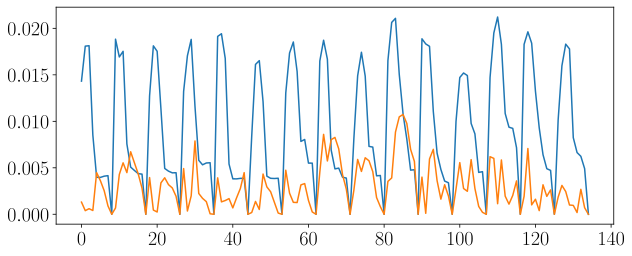

In [63]:
plt.figure(figsize=(10, 4))
plt.plot(training_samples_All_sm_cum_std_10k.reshape(-1))
plt.plot((np.abs(sm_GP_train_cumulative_all -  training_samples_All_sm_cum_mean_10k)).reshape(-1))
plt.show();

# Plots

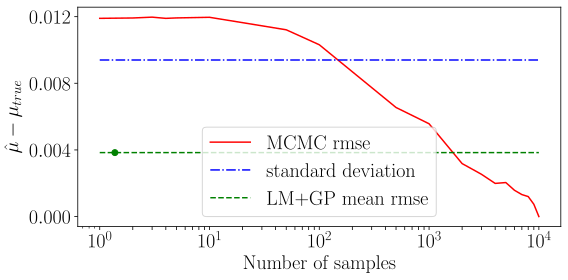

In [77]:
x = [1, 2,3,4,5, 10, 50, 100, 500, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]
x_ticks_log = [1,2,3,4,5,6,7,8,9,
              10,20,30,40,50,60,70,80,90,
              100,200,300,400,500,600,700,800,900,
              1000,2000,3000,4000,5000,6000,7000,8000,9000,10000]

y_ticks = np.arange(0, 0.013, 0.004)

ESS_samples_mean_rmse = [rmse_s_mean_1, rmse_s_mean_2, rmse_s_mean_3, rmse_s_mean_4, rmse_s_mean_5,
                         rmse_s_mean_10, rmse_s_mean_50,
                    rmse_s_mean_100, rmse_s_mean_500, rmse_s_mean_1k, rmse_s_mean_2k,
                    rmse_s_mean_3k, rmse_s_mean_4k, rmse_s_mean_5k, rmse_s_mean_6k, 
                    rmse_s_mean_7k, rmse_s_mean_8k, rmse_s_mean_9k, rmse_s_mean_10k]

ESS_samples_mean_mad = [mad_s_mean_1, mad_s_mean_2, mad_s_mean_3, mad_s_mean_4, mad_s_mean_5,
                        mad_s_mean_10, mad_s_mean_50,
                   mad_s_mean_100, mad_s_mean_500, mad_s_mean_1k, mad_s_mean_2k,
                   mad_s_mean_3k, mad_s_mean_4k, mad_s_mean_5k, mad_s_mean_6k, 
                   mad_s_mean_7k, mad_s_mean_8k, mad_s_mean_9k, mad_s_mean_10k]

fig = plt.figure(figsize=(8, 4))
legend_size = 20
xlabel_size = 20
ylabel_size = 20

plt.rc('text', usetex=True)
plt.rc('ytick', labelsize=20)
plt.rc('xtick', labelsize=20)
plt.rc('axes', labelsize=20)

plt.xscale('log')
plt.plot(x, ESS_samples_mean_rmse, label='MCMC rmse', color='red')
#plt.plot(x, ESS_samples_mean_mad, label='MCMC mad', color='darkred')
plt.plot(x, [training_samples_All_sm_cum_std_10k.mean()] * len(x), '-.', label='standard deviation', color='blue')
plt.plot(x, [rmse_LM_GP_mean] * len(x), '--', label='LM+GP mean rmse', color='green')
#plt.plot(x, [mad_LM_GP_mean] * len(x), '--', label='LM+GP mean mad', color='darkgreen')
plt.plot(one_sample_ratio,[rmse_LM_GP_mean],'go')

plt.xticks(x_ticks_log)
plt.yticks(y_ticks)
plt.xlabel('Number of samples', size=xlabel_size)
plt.ylabel('$\hat{\mu} - \mu_{true}$', size=ylabel_size)
plt.legend(prop={'size': legend_size})

plt.tight_layout()

#"""
tpl.save(
    "distance_mu.tex",
    figure = fig,
    axis_width = "\\figwidth",
    axis_height= "\\figheight",
    tex_relative_path_to_data=".",
    override_externals=True,
    float_format=".3g"
)
#"""
plt.savefig('distance_mu.pdf')

plt.show();

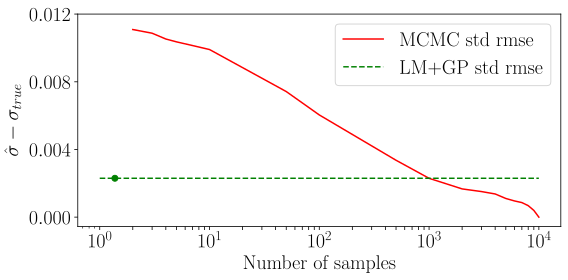

In [79]:
x = [1, 2,3,4,5, 10, 50, 100, 500, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]
x_ = [2,3,4,5, 10, 50, 100, 500, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]

ESS_samples_std_rmse = [rmse_s_std_2, rmse_s_std_3, rmse_s_std_4, rmse_s_std_5, 
                        rmse_s_std_10, rmse_s_std_50,
                    rmse_s_std_100, rmse_s_std_500, rmse_s_std_1k, rmse_s_std_2k,
                    rmse_s_std_3k, rmse_s_std_4k, rmse_s_std_5k, rmse_s_std_6k, 
                    rmse_s_std_7k, rmse_s_std_8k, rmse_s_std_9k, rmse_s_std_10k]

ESS_samples_std_mad = [mad_s_std_2, mad_s_std_3, mad_s_std_4, mad_s_std_5,
                       mad_s_std_10, mad_s_std_50,
                   mad_s_std_100, mad_s_std_500, mad_s_std_1k, mad_s_std_2k,
                   mad_s_std_3k, mad_s_std_4k, mad_s_std_5k, mad_s_std_6k, 
                   mad_s_std_7k, mad_s_std_8k, mad_s_std_9k, mad_s_std_10k]

fig = plt.figure(figsize=(8, 4))
legend_size = 20
xlabel_size = 20
ylabel_size = 20

plt.rc('text', usetex=True)
plt.rc('ytick', labelsize=20)
plt.rc('xtick', labelsize=20)
plt.rc('axes', labelsize=20)

plt.xscale('log')
plt.plot(x_, ESS_samples_std_rmse, label='MCMC std rmse', color='red')
#plt.plot(x_, ESS_samples_std_mad, label='MCMC std mad', color='darkred')
plt.plot(x, [rmse_LM_GP_s_std] * len(x), '--', label='LM+GP std rmse', color='green')
#plt.plot(x, [mad_LM_GP_s_std] * len(x), '--', label='LM+GP std mad', color='darkgreen')
plt.plot(one_sample_ratio,[rmse_LM_GP_s_std],'go')

plt.xticks(x_ticks_log)
plt.yticks(y_ticks)
plt.xlabel('Number of samples', size=xlabel_size)
plt.ylabel('$\hat{\sigma} - \sigma_{true}$', size=ylabel_size)
plt.legend(prop={'size': legend_size})

plt.tight_layout()

#"""
tpl.save(
    "distance_sigma.tex",
    figure = fig,
    axis_width = "\\figwidth",
    axis_height= "\\figheight",
    tex_relative_path_to_data=".",
    override_externals=True,
    float_format=".3g"
)
#"""

plt.savefig('distance_sigma.pdf')

plt.show();